In [1]:
%matplotlib inline
import requests
import pandas as pd
import numpy as np
import warnings
import json
import urllib
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import csv
from scipy.integrate import odeint
from scipy.integrate import solve_ivp
from scipy.optimize import minimize, rosen
from datetime import timedelta, datetime



states_url = "https://covidtracking.com/api/states/daily"
us_url = "https://covidtracking.com/api/us/daily"

states_beds_url = "https://services7.arcgis.com/LXCny1HyhQCUSueu/arcgis/rest/services/Definitive_Healthcare_USA_Hospital_Beds/FeatureServer/0/query?where=1%3D1&outFields=*&returnGeometry=false&outSR=4326&f=json"

def isNaN(num):
    return num != num

In [2]:
r = requests.get(states_url)
states_df = pd.DataFrame(r.json())
states_df['date'] = pd.to_datetime(states_df.date, format="%Y%m%d")
states_df['days_since'] = (states_df.date - pd.to_datetime('2020-03-21') ).astype('timedelta64[D]')
states_df = states_df[['date', 'days_since', 'state', 'hospitalized']]
states_df = states_df.sort_values(by=['state', 'date'])
cols = {}
stateCurves = {}
stateBeds = {}

#Data From esri API for Beds
#Note - A few states are not accounted for correctly in the API
#https://coronavirus-resources.esri.com/datasets/definitivehc::definitive-healthcare-usa-hospital-beds/geoservice?geometry=10.019%2C-16.820%2C-34.981%2C72.123
#https://services7.arcgis.com/LXCny1HyhQCUSueu/arcgis/rest/services/Definitive_Healthcare_USA_Hospital_Beds/FeatureServer/0/query?where=1%3D1&outFields=*&returnGeometry=false&outSR=4326&f=json
r = requests.get(states_beds_url)
beds_json = r.json()["features"]

for item in beds_json:
    if item['attributes']['HQ_STATE'] not in stateBeds:
        stateBeds[item['attributes']['HQ_STATE']] = 0
    if item['attributes']['NUM_LICENSED_BEDS'] is not None:
        stateBeds[item['attributes']['HQ_STATE']] = stateBeds[item['attributes']['HQ_STATE']] + item['attributes']['NUM_LICENSED_BEDS'] 

    if item['attributes']['NUM_ICU_BEDS'] is not None:
        stateBeds[item['attributes']['HQ_STATE']] = stateBeds[item['attributes']['HQ_STATE']] + item['attributes']['NUM_ICU_BEDS']

    if item['attributes']['Potential_Increase_In_Bed_Capac'] is not None:
        stateBeds[item['attributes']['HQ_STATE']] = stateBeds[item['attributes']['HQ_STATE']] + item['attributes']['Potential_Increase_In_Bed_Capac']

# #     {'STATE_NAME': 'Arizona', 'NUM_LICENSED_BEDS': 62, 'NUM_ICU_BEDS': None, 'BED_UTILIZATION': None, 'NUM_STAFFED_BEDS': 62, 'Potential_Increase_In_Bed_Capac': 0}

#print(stateBeds)
sum(stateBeds.values())
#Looks like roughly only half of beds are reported by this API


430522

In [3]:
#Data From NY Times Article For Beds (Google Sheets / CSV file)
#https://docs.google.com/spreadsheets/d/1XUVyZF3X_4m72ztFnXZFvDKn5Yys1aKgu2Zmefd7wVo/edit#gid=1576394115

NYT_Beds_df = pd.read_csv('Hospital_Capacity_By_State.csv', thousands=',')
NYT_Beds_df = NYT_Beds_df[['State', 'Potentially Available Hospital Beds*', 'Potentially Available ICU Beds*']]
NYT_Beds_df.drop(NYT_Beds_df.tail(2).index,inplace=True)
NYT_Beds_df['Potentially Available Hospital Beds*'] = pd.to_numeric(NYT_Beds_df['Potentially Available Hospital Beds*'])
NYT_Beds_df['Potentially Available ICU Beds*'] = pd.to_numeric(NYT_Beds_df['Potentially Available ICU Beds*'])
NYT_Beds_df['Total Potentially Available Beds'] = NYT_Beds_df['Potentially Available Hospital Beds*'] + NYT_Beds_df['Potentially Available ICU Beds*']
#*Based on a 50% reduction in occupancy

NYT_Beds_df = NYT_Beds_df[['State','Total Potentially Available Beds']]
#NYT_Beds = NYT_Beds_df.to_dict('series')

#print(NYT_Beds_df)
stateBedsList = NYT_Beds_df['State'].tolist()
#print(NYT_Beds_df['Total Potentially Available Beds'].sum())

#print(NYT_Beds_df.loc[NYT_Beds_df['State'] == 'NH']['Total Potentially Available Beds'])


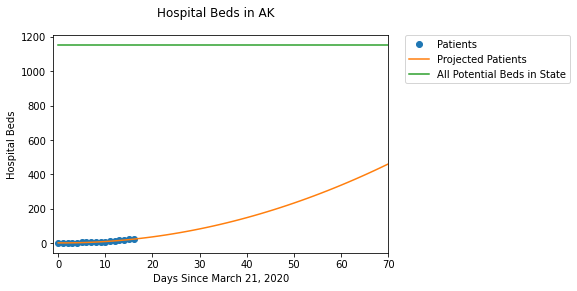

Beds in  AK : 1151
Projected Bed Function: 
         2
0.09636 x - 0.1815 x + 0.2663


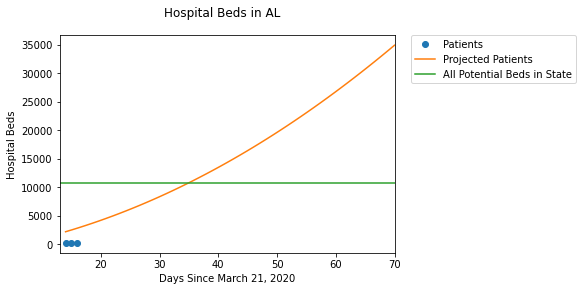

Beds in  AL : 10714
Projected Bed Function: 
   2
5 x + 164 x - 1104


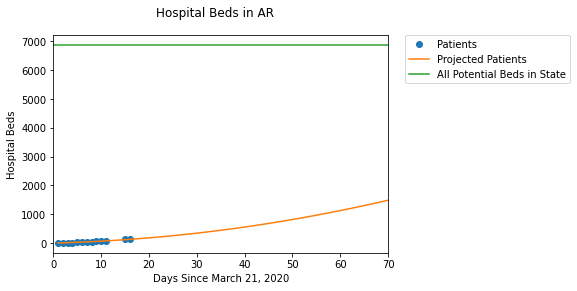

Beds in  AR : 6857
Projected Bed Function: 
        2
0.2439 x + 4.107 x + 7.067


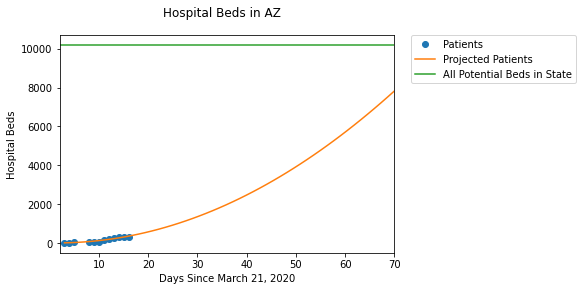

Beds in  AZ : 10181
Projected Bed Function: 
      2
1.67 x - 5.282 x + 13.3


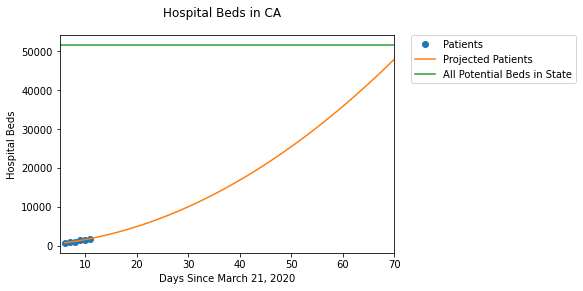

Beds in  CA : 51448
Projected Bed Function: 
      2
8.75 x + 71.02 x + 24.94


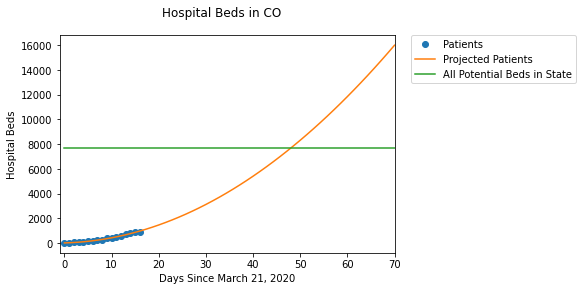

Beds in  CO : 7708
Projected Bed Function: 
       2
3.113 x + 10.15 x + 23.72


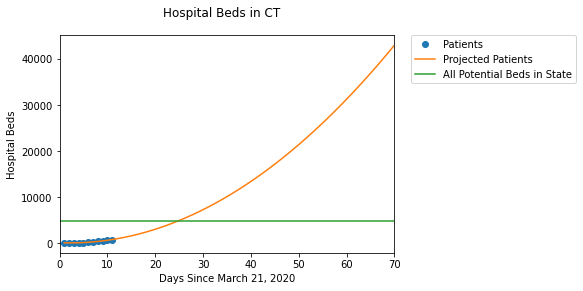

Beds in  CT : 4777
Projected Bed Function: 
      2
9.33 x - 41.06 x + 94.18


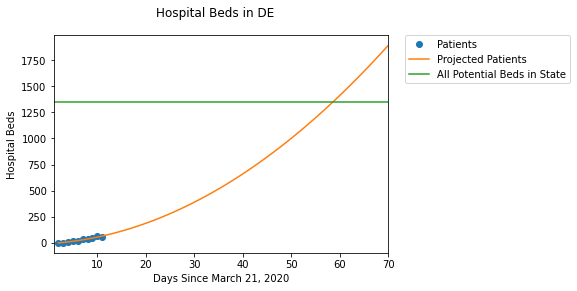

Beds in  DE : 1346
Projected Bed Function: 
        2
0.3485 x + 2.785 x - 8.8


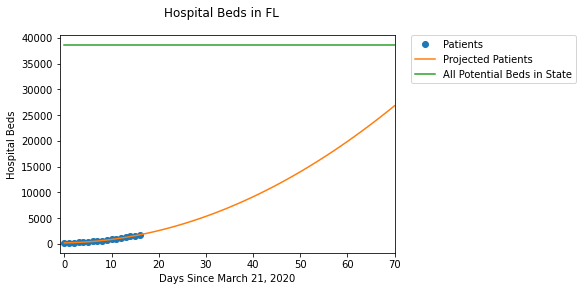

Beds in  FL : 38556
Projected Bed Function: 
       2
5.218 x + 15.11 x + 165.1


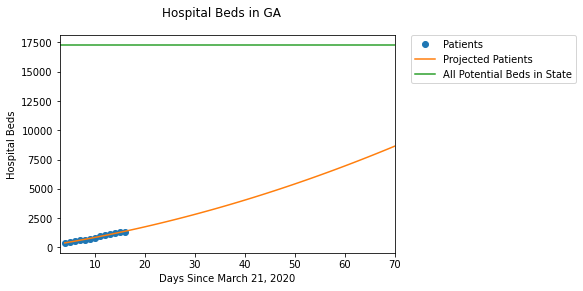

Beds in  GA : 17248
Projected Bed Function: 
        2
0.7862 x + 66.79 x + 109.8


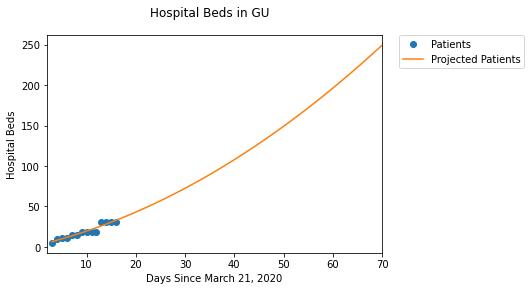

Beds in  GU : 17248
Projected Bed Function: 
         2
0.02953 x + 1.463 x + 2.027


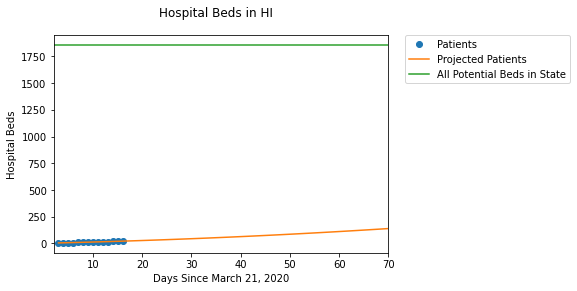

Beds in  HI : 1855
Projected Bed Function: 
         2
0.01374 x + 1.003 x + 0.9396


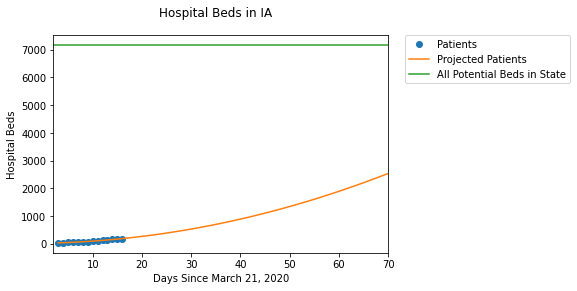

Beds in  IA : 7163
Projected Bed Function: 
        2
0.4732 x + 2.837 x + 16.22


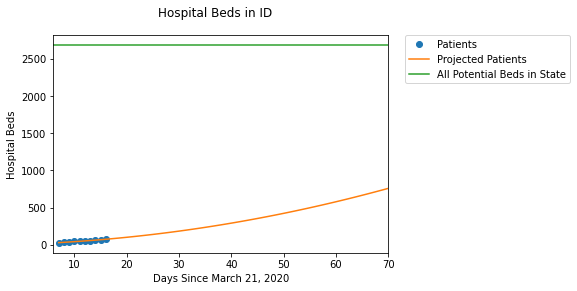

Beds in  ID : 2681
Projected Bed Function: 
        2
0.1212 x + 2.236 x + 7.352


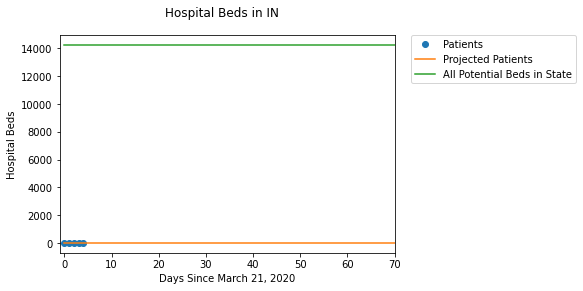

Beds in  IN : 14225
Projected Bed Function: 
           2
5.375e-17 x - 1.622e-16 x + 1


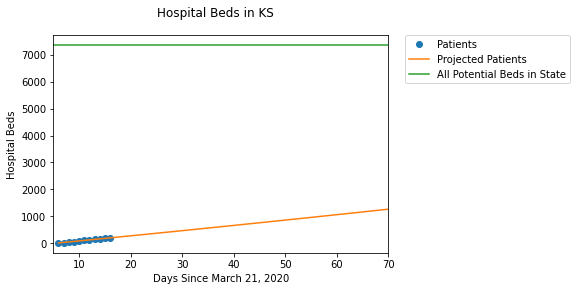

Beds in  KS : 7349
Projected Bed Function: 
         2
0.01515 x + 18.38 x - 94.22


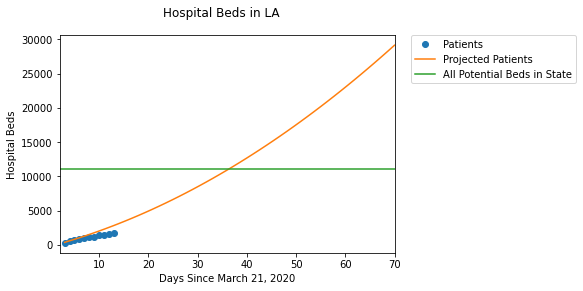

Beds in  LA : 11011
Projected Bed Function: 
       2
3.228 x + 194 x - 254.2


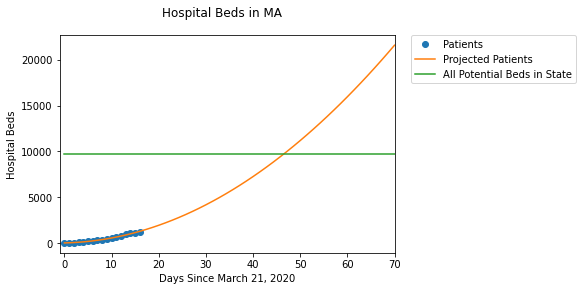

Beds in  MA : 9744
Projected Bed Function: 
       2
4.231 x + 11.4 x + 37.95


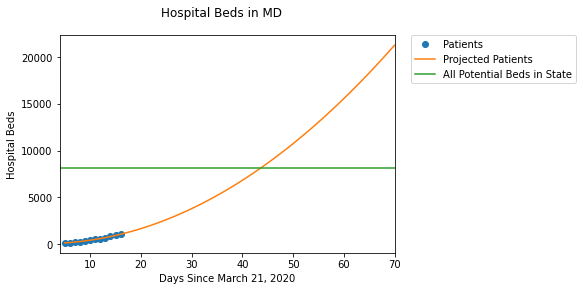

Beds in  MD : 8098
Projected Bed Function: 
       2
4.466 x - 10.06 x + 74.55


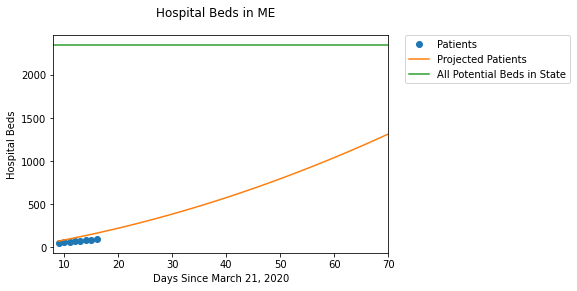

Beds in  ME : 2343
Projected Bed Function: 
        2
0.1369 x + 9.53 x - 25.39


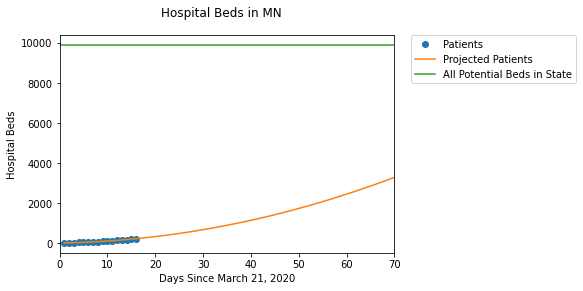

Beds in  MN : 9878
Projected Bed Function: 
        2
0.6159 x + 3.683 x + 6.986


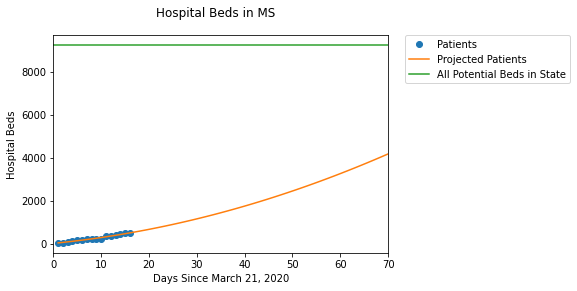

Beds in  MS : 9227
Projected Bed Function: 
        2
0.5364 x + 21.9 x + 11.31


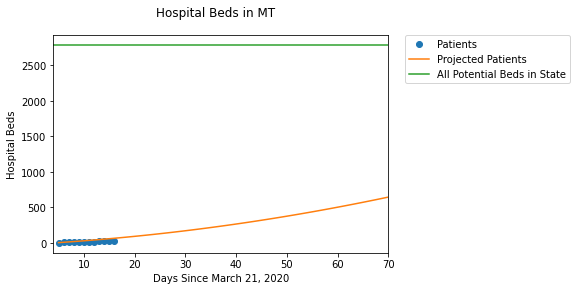

Beds in  MT : 2784
Projected Bed Function: 
         2
0.07942 x + 3.899 x - 16.23


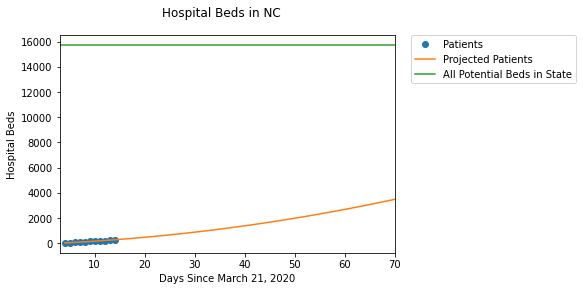

Beds in  NC : 15716
Projected Bed Function: 
        2
0.4883 x + 16.22 x - 51.05


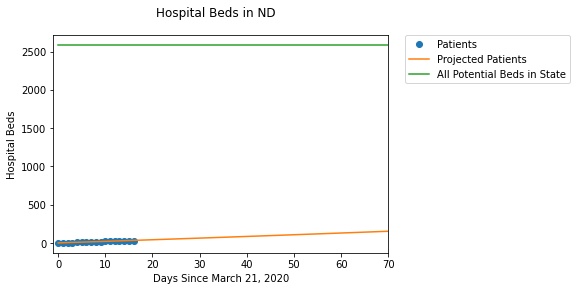

Beds in  ND : 2582
Projected Bed Function: 
          2
0.002064 x + 2.031 x + 0.7492


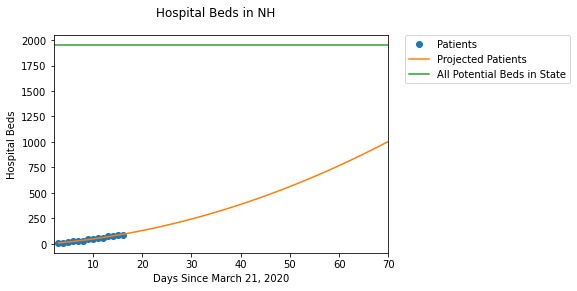

Beds in  NH : 1949
Projected Bed Function: 
        2
0.1545 x + 3.578 x - 2.593


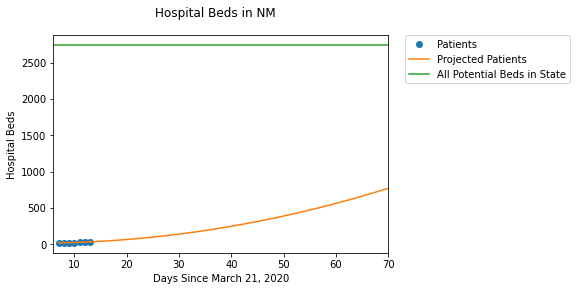

Beds in  NM : 2738
Projected Bed Function: 
        2
0.1667 x - 0.9048 x + 15.43


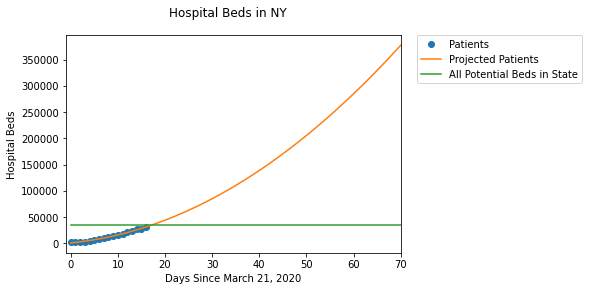

Beds in  NY : 34676
Projected Bed Function: 
       2
64.33 x + 876.3 x + 736.5


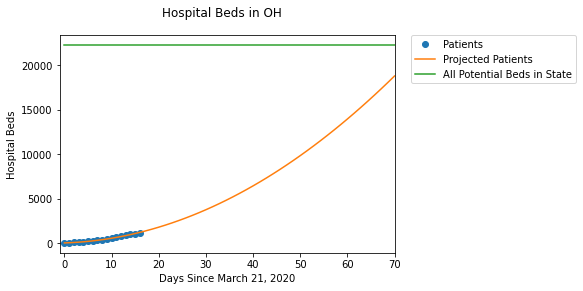

Beds in  OH : 22232
Projected Bed Function: 
       2
3.584 x + 16.56 x + 56.7


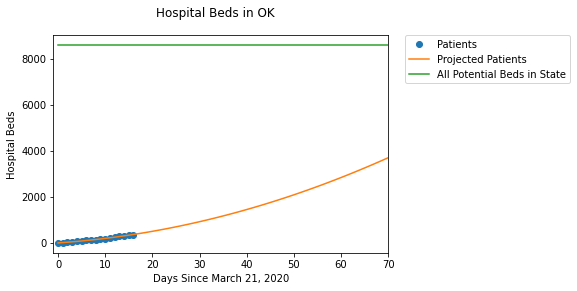

Beds in  OK : 8579
Projected Bed Function: 
        2
0.5535 x + 14.09 x - 5.055


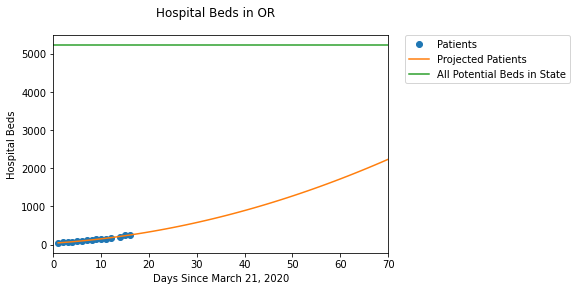

Beds in  OR : 5223
Projected Bed Function: 
        2
0.3337 x + 8.038 x + 36.24


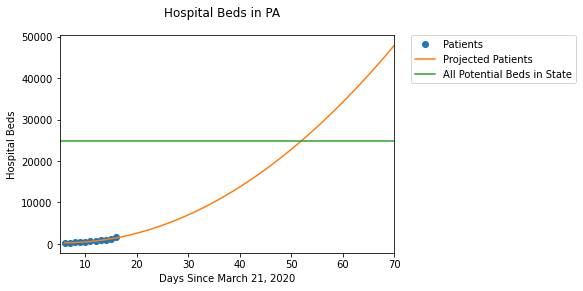

Beds in  PA : 24804
Projected Bed Function: 
      2
11.6 x - 137.3 x + 689.7


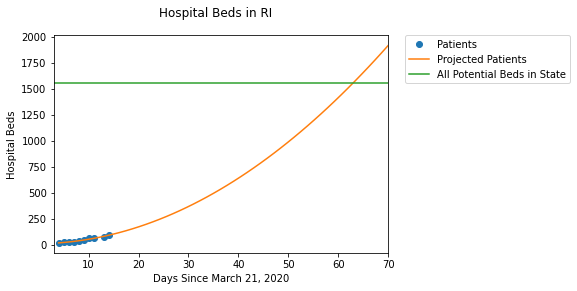

Beds in  RI : 1559
Projected Bed Function: 
        2
0.3837 x + 0.423 x + 8.435


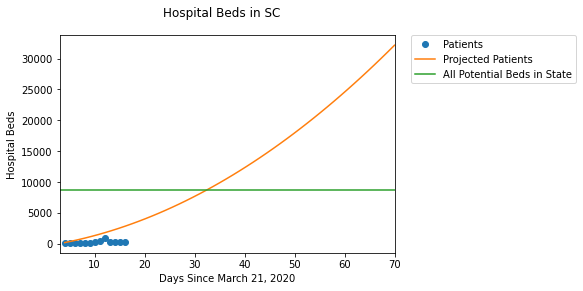

Beds in  SC : 8726
Projected Bed Function: 
       2
4.917 x + 120.9 x - 404.6


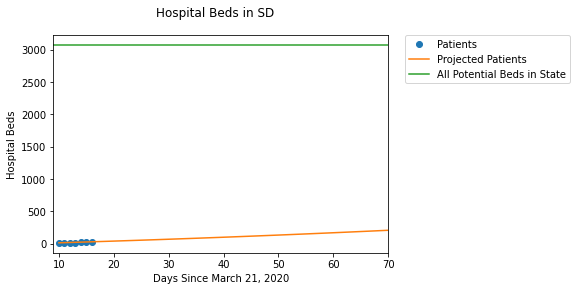

Beds in  SD : 3067
Projected Bed Function: 
        2
0.0119 x + 2.274 x - 10.07


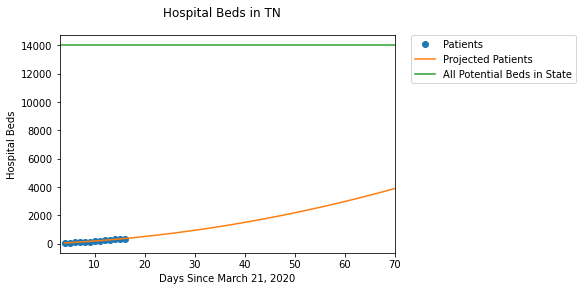

Beds in  TN : 14018
Projected Bed Function: 
        2
0.5959 x + 14.03 x - 11.87


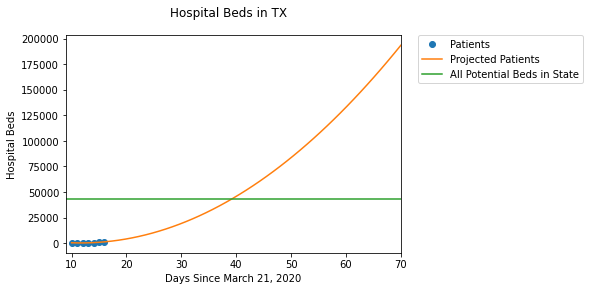

Beds in  TX : 43556
Projected Bed Function: 
       2
56.96 x - 1333 x + 7903


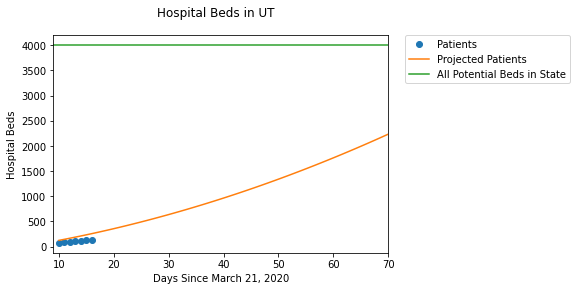

Beds in  UT : 4000
Projected Bed Function: 
        2
0.2381 x + 16.12 x - 61.36


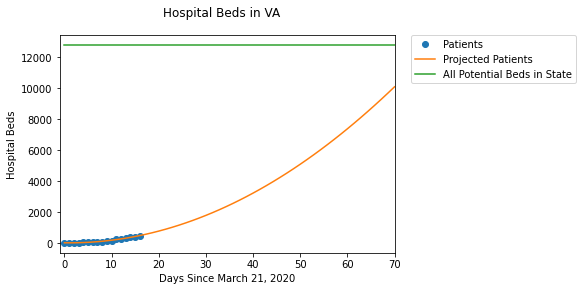

Beds in  VA : 12774
Projected Bed Function: 
      2
2.12 x - 4.699 x + 33.34


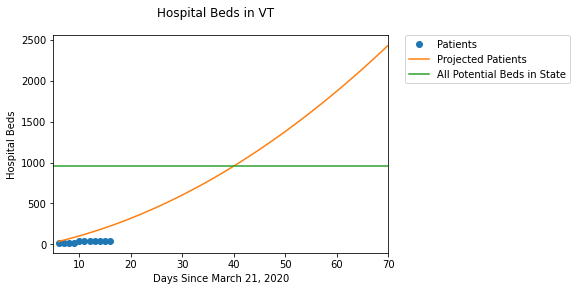

Beds in  VT : 963
Projected Bed Function: 
        2
0.3462 x + 11.13 x - 42.76


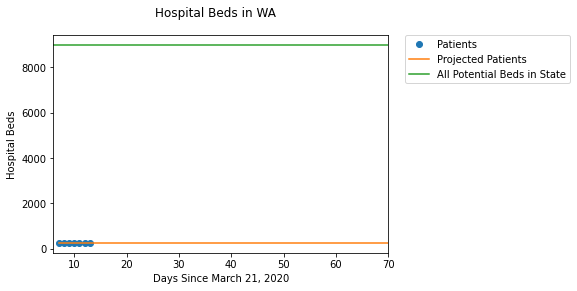

Beds in  WA : 8975
Projected Bed Function: 
           2
1.512e-15 x - 2.528e-14 x + 254


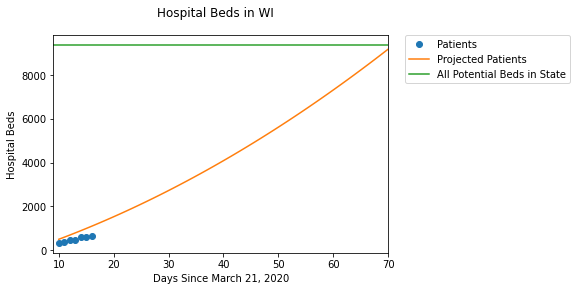

Beds in  WI : 9351
Projected Bed Function: 
        2
0.8333 x + 77.81 x - 358.4


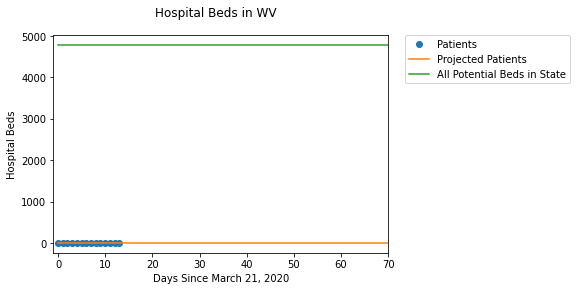

Beds in  WV : 4778
Projected Bed Function: 
           2
1.376e-17 x + 1.552e-16 x + 1


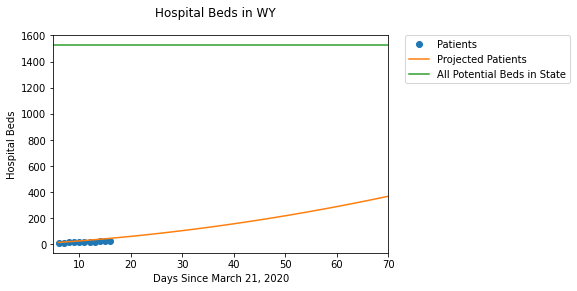

Beds in  WY : 1525
Projected Bed Function: 
         2
0.04429 x + 2.156 x + 0.3566


In [4]:
#Outdated simulation of state hospital bed capacity based on hospital admittance historical data

states_df.dropna(subset = ["hospitalized"], inplace=True)
#remove all NaN reports of patients in hospitals

for state in states_df.state.unique():
    stateData = states_df[(states_df.state == state)]
    if len(stateData) == 1:
        #Do not include States with only 1 data point
        pass
    if len(stateData) > 1:
        polynomial = 0
        if len(stateData) == 2:
            polynomial = 1
        if len(stateData) > 2:
            polynomial = 2
        hospital_list = stateData['hospitalized'].tolist()
        y = np.array(hospital_list)   
        days_since_list = stateData['days_since'].tolist()
        x = np.array(days_since_list)
        # calculate polynomial
        z = np.polyfit(x, y, polynomial)
        f = np.poly1d(z)
        if f.c[0] < 0:
            f.c[0] = f.c[0]*(-1)
        # calculate new x's and y's
        x_new = np.linspace(x[0], 70, 50)
        y_new = f(x_new)
        
        plt.plot(x,y,'o', label="Patients")
        plt.plot(x_new, y_new, label="Projected Patients")

        if state in stateBedsList:
            x_beds = [0, 70]
            beds_in_state = int(NYT_Beds_df.loc[NYT_Beds_df['State'] == str(state)]['Total Potentially Available Beds'])
            y_beds = [beds_in_state, beds_in_state]
            plt.plot(x_beds, y_beds, label="All Potential Beds in State")
            
        plt.xlim([x[0]-1, 70 ])
        plt.suptitle('Hospital Beds in '+ state)
        plt.ylabel('Hospital Beds')
        plt.xlabel('Days Since March 21, 2020')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.show()
        print('Beds in ',state,':', beds_in_state)
        print('Projected Bed Function: ')
        print(f)



In [5]:
#Load data from API - states_url = "https://covidtracking.com/api/states/daily"
r = requests.get(states_url)
states_inf_df = pd.DataFrame(r.json())
states_inf_df['date'] = pd.to_datetime(states_inf_df.date, format="%Y%m%d")
#states_inf_df['days_since'] = (states_inf_df.date - pd.to_datetime('2020-03-21') ).astype('timedelta64[D]')
#states_inf_df = states_inf_df[['date', 'days_since', 'state', 'hospitalized']]
states_inf_df = states_inf_df.sort_values(by=['state', 'date'])

states_inf_df

,date,state,positive,negative,pending,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,inIcuCumulative,onVentilatorCurrently,...,hospitalized,total,totalTestResults,posNeg,fips,deathIncrease,hospitalizedIncrease,negativeIncrease,positiveIncrease,totalTestResultsIncrease
1691,2020-03-06,AK,0.0,8.0,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,9,8,8,02,NaN,NaN,NaN,NaN,NaN
1640,2020-03-07,AK,0.0,12.0,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,14,12,12,02,0.0,0.0,4.0,0.0,4.0
1589,2020-03-08,AK,0.0,14.0,6.0,NaN,NaN,NaN,NaN,NaN,...,NaN,20,14,14,02,0.0,0.0,2.0,0.0,2.0
1538,2020-03-09,AK,0.0,23.0,9.0,NaN,NaN,NaN,NaN,NaN,...,NaN,32,23,23,02,0.0,0.0,9.0,0.0,9.0
1487,2020-03-10,AK,0.0,23.0,9.0,NaN,NaN,NaN,NaN,NaN,...,NaN,32,23,23,02,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,2020-04-02,WY,150.0,2439.0,NaN,NaN,19.0,NaN,NaN,NaN,...,19.0,2589,2589,2589,56,0.0,1.0,221.0,20.0,241.0
223,2020-04-03,WY,162.0,2704.0,NaN,NaN,21.0,NaN,NaN,NaN,...,21.0,2866,2866,2866,56,0.0,2.0,265.0,12.0,277.0
167,2020-04-04,WY,187.0,2945.0,NaN,NaN,23.0,NaN,NaN,NaN,...,23.0,3132,3132,3132,56,0.0,2.0,241.0,25.0,266.0
111,2020-04-05,WY,197.0,3040.0,NaN,NaN,23.0,NaN,NaN,NaN,...,23.0,3237,3237,3237,56,0.0,0.0,95.0,10.0,105.0


AK


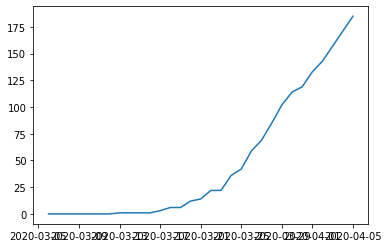

AL


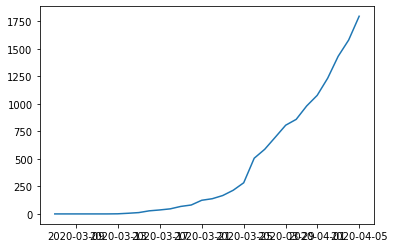

AR


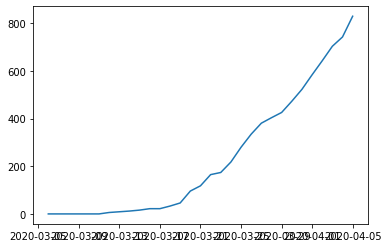

AS


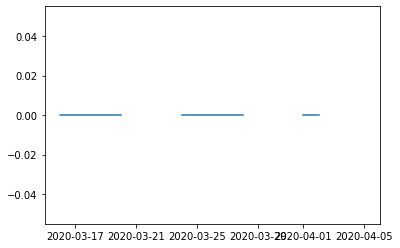

AZ


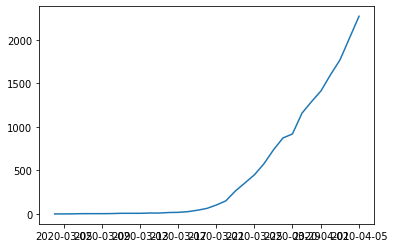

CA


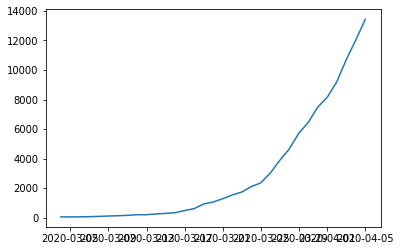

CO


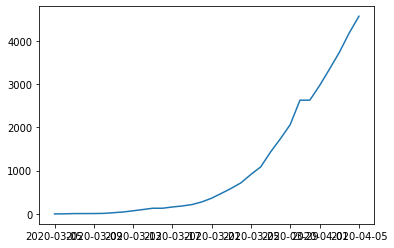

CT


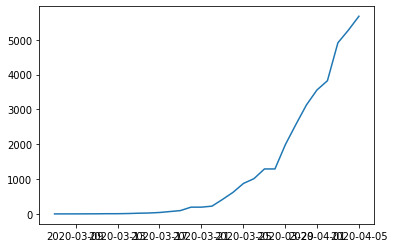

DC


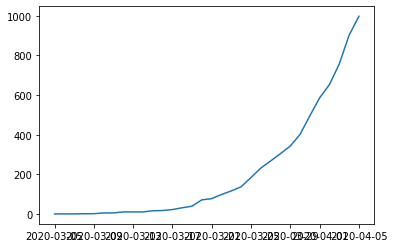

DE


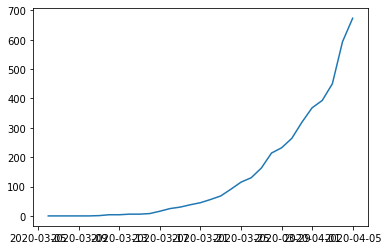

FL


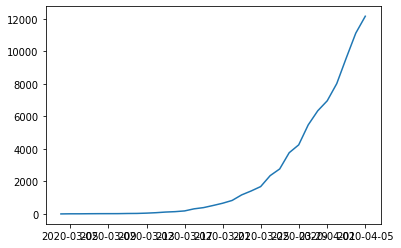

GA


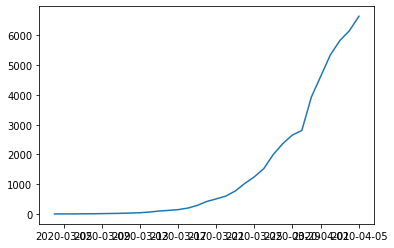

GU


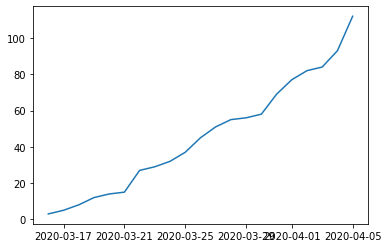

HI


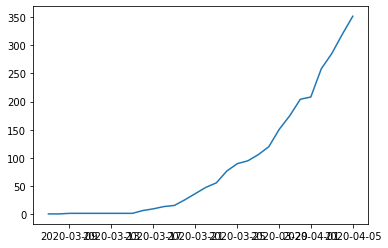

IA


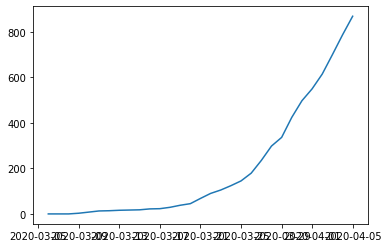

ID


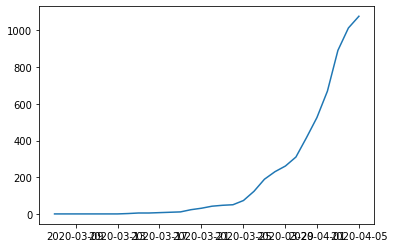

IL


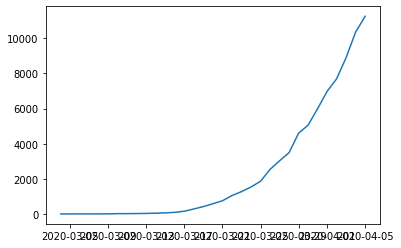

IN


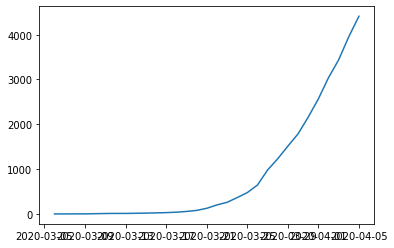

KS


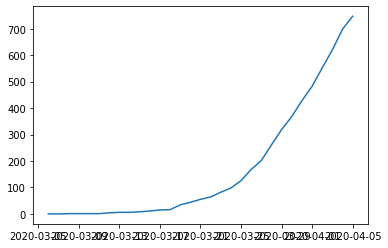

KY


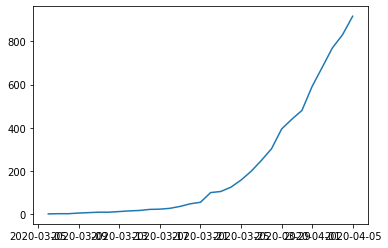

LA


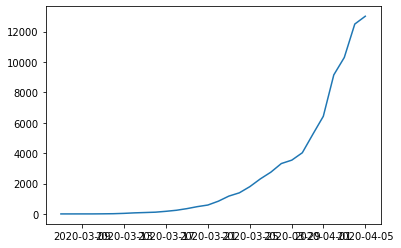

MA


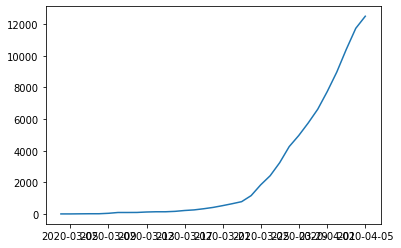

MD


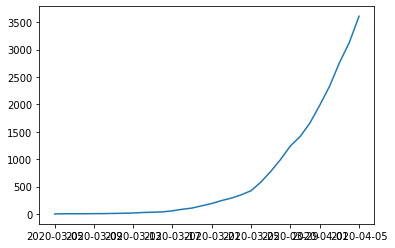

ME


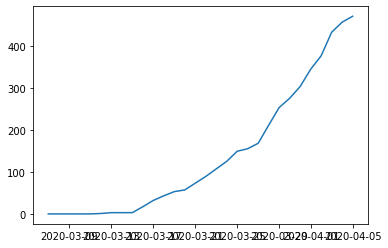

MI


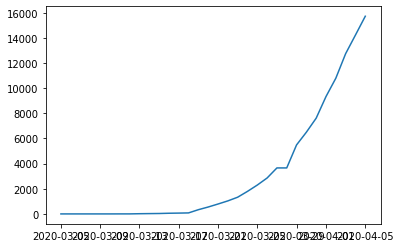

MN


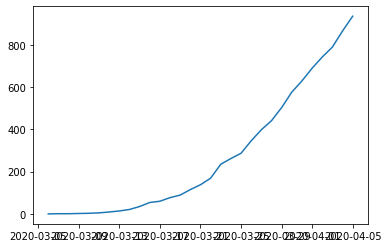

MO


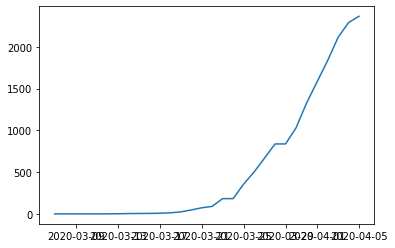

MP


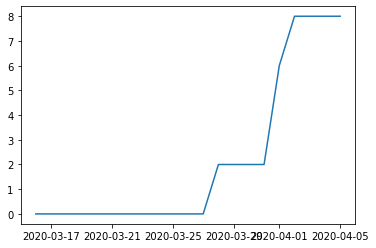

MS


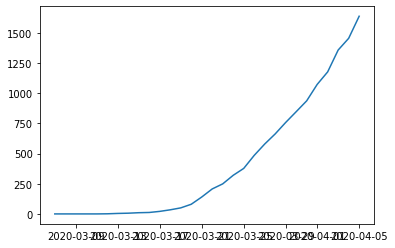

MT


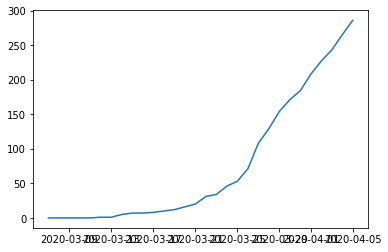

NC


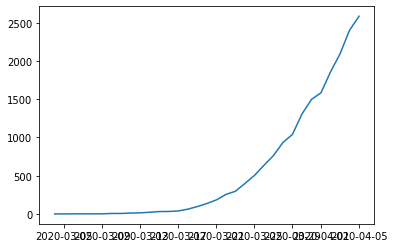

ND


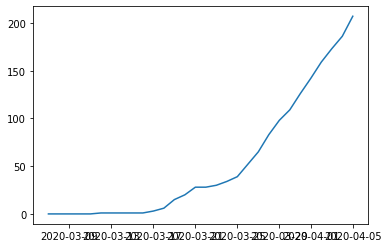

NE


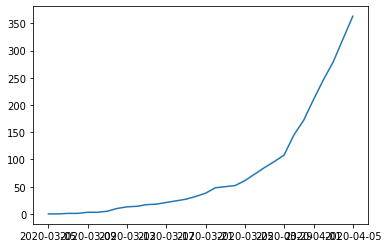

NH


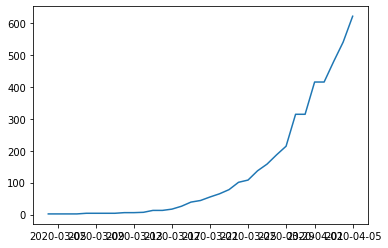

NJ


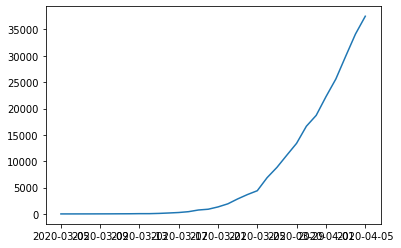

NM


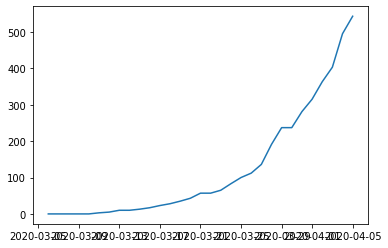

NV


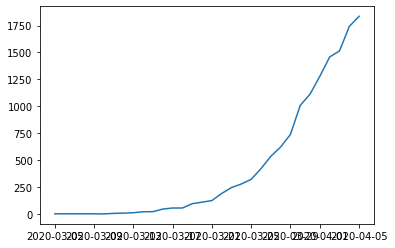

NY


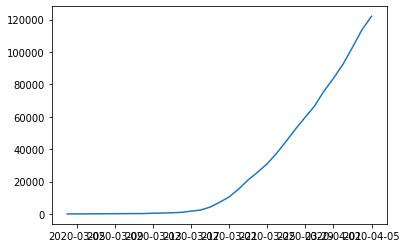

OH


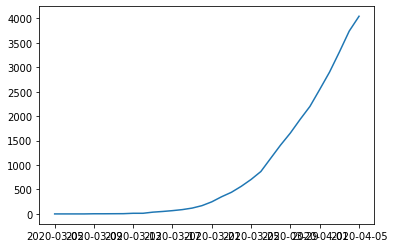

OK


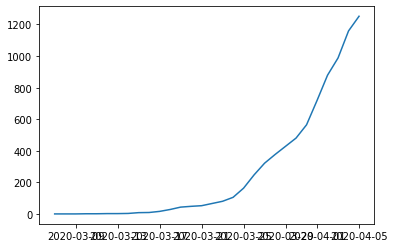

OR


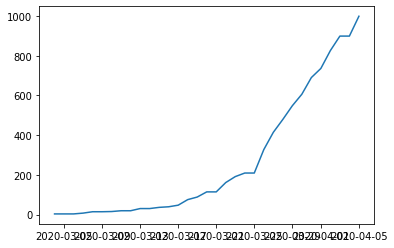

PA


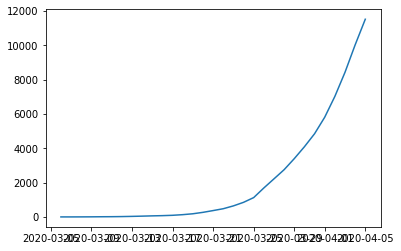

PR


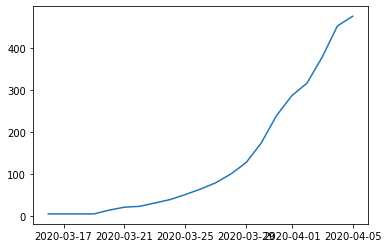

RI


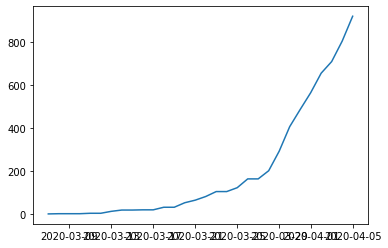

SC


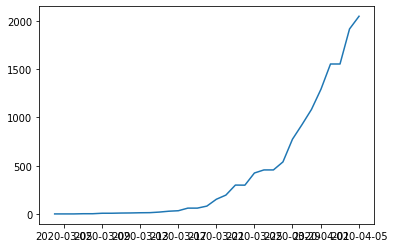

SD


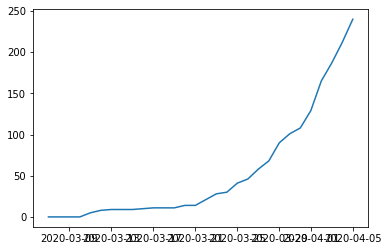

TN


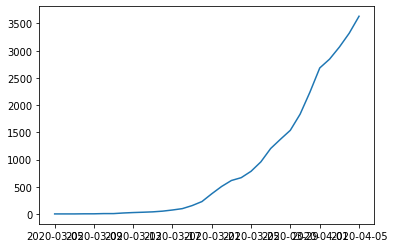

TX


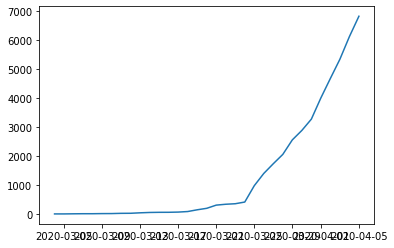

UT


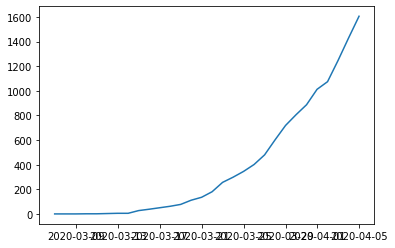

VA


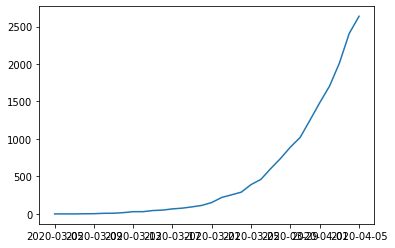

VI


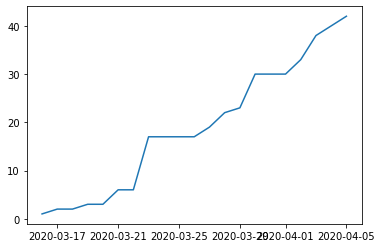

VT


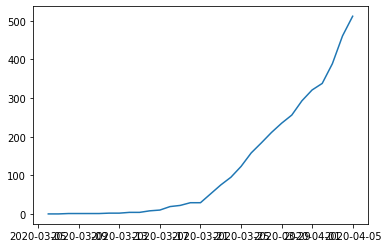

WA


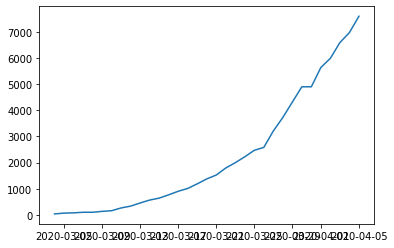

WI


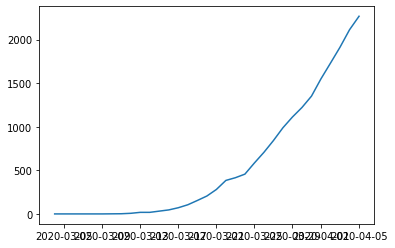

WV


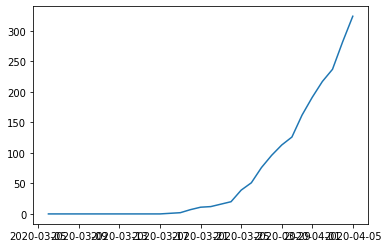

WY


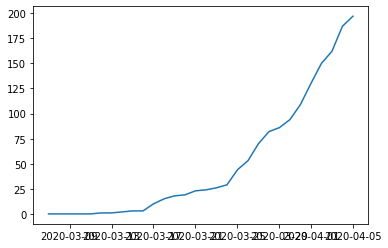

In [11]:
#Plotting infections over time per state for sanity check
for state in states_inf_df.state.unique():
    stateDataDates = states_inf_df[(states_inf_df.state == state)]['date']
    stateDataPos = states_inf_df[(states_inf_df.state == state)]['positive']
    print(state)
    plt.plot(stateDataDates, stateDataPos)
    plt.show()

In [13]:
#Load data from API - states_url = "https://covidtracking.com/api/states/daily"
states_url = "https://covidtracking.com/api/states/daily"
r = requests.get(states_url)
states_df = pd.DataFrame(r.json())
states_df.dropna(subset = ["positive"], inplace=True)
states_df['date'] = pd.to_datetime(states_df.date, format="%Y%m%d").dt.date
states_df['date'] = states_df['date'].apply(lambda x: x.strftime('%-m/%-d/%Y'))
# states_df = states_df.sort_values(by=['state', 'date'])

AK
    state  infected  hospitalized  beds        date     ratio
0      AK  1.000000      0.000000  1151   3/13/2020  0.000000
1      AK  1.270712      0.000000  1151   3/14/2020  0.000000
2      AK  1.614686      0.000000  1151   3/15/2020  0.000000
3      AK  2.051854      0.000000  1151   3/16/2020  0.000000
4      AK  2.607017      0.000000  1151   3/17/2020  0.000000
..    ...       ...           ...   ...         ...       ...
145    AK  8.602445      3.658973  1151  08/05/2020  0.003179
146    AK  8.020741      3.413068  1151  08/06/2020  0.002965
147    AK  7.478417      3.183443  1151  08/07/2020  0.002766
148    AK  6.972798      2.968648  1151  08/08/2020  0.002579
149    AK  6.501370      2.767909  1151  08/09/2020  0.002405

[150 rows x 6 columns]
AL
    state   infected  hospitalized   beds        date     ratio
0      AL   1.000000      0.000000  10714   3/13/2020  0.000000
1      AL   1.402964      0.000000  10714   3/14/2020  0.000000
2      AL   1.968284      0.000000

GU
HI
    state   infected  hospitalized  beds        date     ratio
0      HI   1.000000      0.000000  1855    3/7/2020  0.000000
1      HI   1.232863      0.000000  1855    3/8/2020  0.000000
2      HI   1.519941      0.000000  1855    3/9/2020  0.000000
3      HI   1.873941      0.000000  1855   3/10/2020  0.000000
4      HI   2.310177      0.000000  1855   3/11/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    HI  36.051874     15.200985  1855  07/30/2020  0.008195
146    HI  33.678798     14.202383  1855  07/31/2020  0.007656
147    HI  31.462336     13.267439  1855  08/01/2020  0.007152
148    HI  29.391964     12.393865  1855  08/02/2020  0.006681
149    HI  27.457747     11.577801  1855  08/03/2020  0.006241

[150 rows x 6 columns]
IA
    state   infected  hospitalized  beds        date     ratio
0      IA   3.000000      0.000000  7163    3/9/2020  0.000000
1      IA   3.729639      0.000000  7163   3/10/2020  0.000000
2      IA   4.636711  

/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



ME
    state   infected  hospitalized  beds        date     ratio
0      ME   1.000000      0.000000  2343   3/12/2020  0.000000
1      ME   1.311521      0.000000  2343   3/13/2020  0.000000
2      ME   1.720066      0.000000  2343   3/14/2020  0.000000
3      ME   2.255986      0.000000  2343   3/15/2020  0.000000
4      ME   2.958355      0.000000  2343   3/16/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    ME  11.515587      4.937954  2343  08/04/2020  0.002108
146    ME  10.722457      4.597445  2343  08/05/2020  0.001962
147    ME   9.984305      4.280338  2343  08/06/2020  0.001827
148    ME   9.297144      3.985126  2343  08/07/2020  0.001701
149    ME   8.657197      3.710366  2343  08/08/2020  0.001584

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



MI
    state    infected  hospitalized   beds        date     ratio
0      MI    2.000000      0.000000  18434   3/11/2020  0.000000
1      MI    2.912447      0.000000  18434   3/12/2020  0.000000
2      MI    4.241390      0.000000  18434   3/13/2020  0.000000
3      MI    6.175609      0.000000  18434   3/14/2020  0.000000
4      MI    8.993533      0.000000  18434   3/15/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    MI  526.353506    203.744242  18434  08/03/2020  0.011053
146    MI  500.216876    193.613923  18434  08/04/2020  0.010503
147    MI  475.381602    183.989266  18434  08/05/2020  0.009981
148    MI  451.779319    174.845526  18434  08/06/2020  0.009485
149    MI  429.344486    166.158805  18434  08/07/2020  0.009014

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



MN
    state    infected  hospitalized  beds        date     ratio
0      MN    1.000000      0.000000  9878    3/7/2020  0.000000
1      MN    1.279482      0.000000  9878    3/8/2020  0.000000
2      MN    1.637064      0.000000  9878    3/9/2020  0.000000
3      MN    2.094693      0.000000  9878   3/10/2020  0.000000
4      MN    2.679880      0.000000  9878   3/11/2020  0.000000
..    ...         ...           ...   ...         ...       ...
145    MN  105.045322     44.775110  9878  07/30/2020  0.004533
146    MN   97.951509     41.728797  9878  07/31/2020  0.004224
147    MN   91.340599     38.893246  9878  08/01/2020  0.003937
148    MN   85.172527     36.254508  9878  08/02/2020  0.003670
149    MN   79.408515     33.799018  9878  08/03/2020  0.003422

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



MO
    state    infected  hospitalized   beds        date     ratio
0      MO    1.000000      0.000000  13468    3/8/2020  0.000000
1      MO    1.335355      0.000000  13468    3/9/2020  0.000000
2      MO    1.783138      0.000000  13468   3/10/2020  0.000000
3      MO    2.381254      0.000000  13468   3/11/2020  0.000000
4      MO    3.179473      0.000000  13468   3/12/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    MO  148.269636     61.087266  13468  07/31/2020  0.004536
146    MO  139.136878     57.345441  13468  08/01/2020  0.004258
147    MO  130.567258     53.825860  13468  08/02/2020  0.003997
148    MO  122.525869     50.512170  13468  08/03/2020  0.003751
149    MO  114.979743     47.400714  13468  08/04/2020  0.003520

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



MP
MS
    state   infected  hospitalized  beds        date     ratio
0      MS   1.000000      0.000000  9227   3/12/2020  0.000000
1      MS   1.380250      0.000000  9227   3/13/2020  0.000000
2      MS   1.905064      0.000000  9227   3/14/2020  0.000000
3      MS   2.629579      0.000000  9227   3/15/2020  0.000000
4      MS   3.628778      0.000000  9227   3/16/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    MS  16.996250      7.344888  9227  08/04/2020  0.000796
146    MS  15.801270      6.827792  9227  08/05/2020  0.000740
147    MS  14.690903      6.346967  9227  08/06/2020  0.000688
148    MS  13.658868      5.900040  9227  08/07/2020  0.000639
149    MS  12.699213      5.484735  9227  08/08/2020  0.000594

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



MT
    state   infected  hospitalized  beds        date     ratio
0      MT   1.000000      0.000000  2784   3/12/2020  0.000000
1      MT   1.281753      0.000000  2784   3/13/2020  0.000000
2      MT   1.642872      0.000000  2784   3/14/2020  0.000000
3      MT   2.105826      0.000000  2784   3/15/2020  0.000000
4      MT   2.698839      0.000000  2784   3/16/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    MT  11.905376      5.078883  2784  08/04/2020  0.001824
146    MT  11.094796      4.734826  2784  08/05/2020  0.001701
147    MT  10.339525      4.413138  2784  08/06/2020  0.001585
148    MT   9.635749      4.112650  2784  08/07/2020  0.001477
149    MT   8.979882      3.832591  2784  08/08/2020  0.001377

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



NC
    state    infected  hospitalized   beds        date     ratio
0      NC    1.000000      0.000000  15716    3/4/2020  0.000000
1      NC    1.288793      0.000000  15716    3/5/2020  0.000000
2      NC    1.660979      0.000000  15716    3/6/2020  0.000000
3      NC    2.140766      0.000000  15716    3/7/2020  0.000000
4      NC    2.758739      0.000000  15716    3/8/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    NC  202.520901     86.539071  15716  07/27/2020  0.005506
146    NC  188.726914     80.621176  15716  07/28/2020  0.005130
147    NC  175.882573     75.109572  15716  07/29/2020  0.004779
148    NC  163.915912     69.978188  15716  07/30/2020  0.004453
149    NC  152.757951     65.201847  15716  07/31/2020  0.004149

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



ND
    state   infected  hospitalized  beds        date     ratio
0      ND   1.000000      0.000000  2582   3/12/2020  0.000000
1      ND   1.262338      0.000000  2582   3/13/2020  0.000000
2      ND   1.593478      0.000000  2582   3/14/2020  0.000000
3      ND   2.011562      0.000000  2582   3/15/2020  0.000000
4      ND   2.539010      0.000000  2582   3/16/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    ND  10.014298      4.247981  2582  08/04/2020  0.001645
146    ND   9.340848      3.963442  2582  08/05/2020  0.001535
147    ND   8.712474      3.698297  2582  08/06/2020  0.001432
148    ND   8.126373      3.451029  2582  08/07/2020  0.001337
149    ND   7.579701      3.220167  2582  08/08/2020  0.001247

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



NE
    state   infected  hospitalized  beds        date     ratio
0      NE   1.000000      0.000000  4626    3/7/2020  0.000000
1      NE   1.231370      0.000000  4626    3/8/2020  0.000000
2      NE   1.516265      0.000000  4626    3/9/2020  0.000000
3      NE   1.867149      0.000000  4626   3/10/2020  0.000000
4      NE   2.299029      0.000000  4626   3/11/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    NE  55.589605     23.420510  4626  07/30/2020  0.005063
146    NE  51.951169     21.880034  4626  07/31/2020  0.004730
147    NE  48.553478     20.441717  4626  08/01/2020  0.004419
148    NE  45.378555     19.099176  4626  08/02/2020  0.004129
149    NE  42.409083     17.846227  4626  08/03/2020  0.003858

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



NH
    state   infected  hospitalized  beds        date     ratio
0      NH   2.000000      0.000000  1949    3/4/2020  0.000000
1      NH   2.404416      0.000000  1949    3/5/2020  0.000000
2      NH   2.890649      0.000000  1949    3/6/2020  0.000000
3      NH   3.475050      0.000000  1949    3/7/2020  0.000000
4      NH   4.177555      0.000000  1949    3/8/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    NH  48.701279     20.293408  1949  07/27/2020  0.010412
146    NH  45.608812     19.001899  1949  07/28/2020  0.009750
147    NH  42.713970     17.792720  1949  07/29/2020  0.009129
148    NH  40.003190     16.660904  1949  07/30/2020  0.008548
149    NH  37.463506     15.601661  1949  07/31/2020  0.008005

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



NJ
    state   infected  hospitalized   beds        date     ratio
0      NJ   1.000000      0.000000  14937    3/5/2020  0.000000
1      NJ   1.441925      0.000000  14937    3/6/2020  0.000000
2      NJ   2.079131      0.000000  14937    3/7/2020  0.000000
3      NJ   2.997980      0.000000  14937    3/8/2020  0.000000
4      NJ   4.322152      0.000000  14937    3/9/2020  0.000000
..    ...        ...           ...    ...         ...       ...
145    NJ  42.937351     18.623384  14937  07/28/2020  0.001247
146    NJ  39.885797     17.301845  14937  07/29/2020  0.001158
147    NJ  37.052096     16.071662  14937  07/30/2020  0.001076
148    NJ  34.420317     14.928700  14937  07/31/2020  0.000999
149    NJ  31.975442     13.867083  14937  08/01/2020  0.000928

[150 rows x 6 columns]
NM


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state   infected  hospitalized  beds        date     ratio
0      NM   3.000000      0.000000  2738   3/11/2020  0.000000
1      NM   3.719255      0.000000  2738   3/12/2020  0.000000
2      NM   4.610917      0.000000  2738   3/13/2020  0.000000
3      NM   5.716126      0.000000  2738   3/14/2020  0.000000
4      NM   7.086421      0.000000  2738   3/15/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    NM  37.633339     15.897036  2738  08/03/2020  0.005806
146    NM  35.154679     14.842340  2738  08/04/2020  0.005421
147    NM  32.840620     13.858838  2738  08/05/2020  0.005062
148    NM  30.677866     12.941918  2738  08/06/2020  0.004727
149    NM  28.653534     12.087094  2738  08/07/2020  0.004415

[150 rows x 6 columns]
NV


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state   infected  hospitalized  beds        date     ratio
0      NV   1.000000      0.000000  4262    3/5/2020  0.000000
1      NV   1.288083      0.000000  4262    3/6/2020  0.000000
2      NV   1.659146      0.000000  4262    3/7/2020  0.000000
3      NV   2.137215      0.000000  4262    3/8/2020  0.000000
4      NV   2.752628      0.000000  4262    3/9/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    NV  42.396889     18.082092  4262  07/28/2020  0.004243
146    NV  39.503329     16.854463  4262  07/29/2020  0.003955
147    NV  36.807258     15.711123  4262  07/30/2020  0.003686
148    NV  34.295252     14.645143  4262  07/31/2020  0.003436
149    NV  31.954707     13.649819  4262  08/01/2020  0.003203

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



NY
    state   infected  hospitalized   beds        date     ratio
0      NY   6.000000      0.000000  34676    3/4/2020  0.000000
1      NY   8.542268      0.000000  34676    3/5/2020  0.000000
2      NY  12.161304      0.000000  34676    3/6/2020  0.000000
3      NY  17.315310      0.000000  34676    3/7/2020  0.000000
4      NY  24.646045      0.000000  34676    3/8/2020  0.000000
..    ...        ...           ...    ...         ...       ...
145    NY  85.130736     36.885513  34676  07/27/2020  0.001064
146    NY  79.094031     34.278126  34676  07/28/2020  0.000989
147    NY  73.487014     31.847418  34676  07/29/2020  0.000918
148    NY  68.278521     29.588105  34676  07/30/2020  0.000853
149    NY  63.439212     27.489038  34676  07/31/2020  0.000793

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



OH
    state    infected  hospitalized   beds        date     ratio
0      OH    3.000000      0.000000  22232    3/9/2020  0.000000
1      OH    3.958757      0.000000  22232   3/10/2020  0.000000
2      OH    5.223896      0.000000  22232   3/11/2020  0.000000
3      OH    6.893141      0.000000  22232   3/12/2020  0.000000
4      OH    9.096522      0.000000  22232   3/13/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    OH  268.927117    110.993046  22232  08/01/2020  0.004992
146    OH  252.313395    104.116268  22232  08/02/2020  0.004683
147    OH  236.687212     97.675562  22232  08/03/2020  0.004393
148    OH  221.991736     91.641349  22232  08/04/2020  0.004122
149    OH  208.207750     85.984861  22232  08/05/2020  0.003868

[150 rows x 6 columns]
OK


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state   infected  hospitalized  beds        date     ratio
0      OK   1.000000      0.000000  8579    3/7/2020  0.000000
1      OK   1.288879      0.000000  8579    3/8/2020  0.000000
2      OK   1.661199      0.000000  8579    3/9/2020  0.000000
3      OK   2.141185      0.000000  8579   3/10/2020  0.000000
4      OK   2.759449      0.000000  8579   3/11/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    OK  58.659567     25.019962  8579  07/30/2020  0.002916
146    OK  54.654015     23.319546  8579  07/31/2020  0.002718
147    OK  50.921927     21.736438  8579  08/01/2020  0.002534
148    OK  47.444734     20.261180  8579  08/02/2020  0.002362
149    OK  44.205001     18.884611  8579  08/03/2020  0.002201

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



OR
    state    infected  hospitalized  beds        date     ratio
0      OR    3.000000      0.000000  5223    3/4/2020  0.000000
1      OR    3.627227      0.000000  5223    3/5/2020  0.000000
2      OR    4.385599      0.000000  5223    3/6/2020  0.000000
3      OR    5.302354      0.000000  5223    3/7/2020  0.000000
4      OR    6.410882      0.000000  5223    3/8/2020  0.000000
..    ...         ...           ...   ...         ...       ...
145    OR  166.675716     69.673397  5223  07/27/2020  0.013340
146    OR  155.980496     65.201557  5223  07/28/2020  0.012484
147    OR  145.973794     61.015478  5223  07/29/2020  0.011682
148    OR  136.609922     57.097894  5223  07/30/2020  0.010932
149    OR  127.845567     53.432253  5223  07/31/2020  0.010230

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



PA
    state    infected  hospitalized   beds        date     ratio
0      PA    2.000000      0.000000  24804    3/6/2020  0.000000
1      PA    2.692607      0.000000  24804    3/7/2020  0.000000
2      PA    3.625157      0.000000  24804    3/8/2020  0.000000
3      PA    4.880261      0.000000  24804    3/9/2020  0.000000
4      PA    6.570572      0.000000  24804   3/10/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    PA  115.359887     49.656128  24804  07/29/2020  0.002002
146    PA  107.357455     46.185768  24804  07/30/2020  0.001862
147    PA   99.909548     42.962708  24804  07/31/2020  0.001732
148    PA   92.967187     39.969762  24804  08/01/2020  0.001611
149    PA   86.485690     37.190245  24804  08/02/2020  0.001499

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



PR
    state   infected  hospitalized  beds        date     ratio
0      PR   5.000000      0.000000  6063   3/16/2020  0.000000
1      PR   6.336130      0.000000  6063   3/17/2020  0.000000
2      PR   8.029039      0.000000  6063   3/18/2020  0.000000
3      PR  10.174274      0.000000  6063   3/19/2020  0.000000
4      PR  12.893313      0.000000  6063   3/20/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    PR  37.412516     15.918513  6063  08/08/2020  0.002626
146    PR  34.895081     14.842273  6063  08/09/2020  0.002448
147    PR  32.549006     13.839272  6063  08/10/2020  0.002283
148    PR  30.361259     12.904839  6063  08/11/2020  0.002128
149    PR  28.319318     12.034455  6063  08/12/2020  0.001985

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



RI
    state   infected  hospitalized  beds        date     ratio
0      RI   2.000000      0.000000  1559    3/7/2020  0.000000
1      RI   2.491330      0.000000  1559    3/8/2020  0.000000
2      RI   3.103405      0.000000  1559    3/9/2020  0.000000
3      RI   3.865575      0.000000  1559   3/10/2020  0.000000
4      RI   4.814988      0.000000  1559   3/11/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    RI  15.856228      6.707595  1559  07/30/2020  0.004302
146    RI  14.807635      6.260748  1559  07/31/2020  0.004016
147    RI  13.828882      5.844203  1559  08/01/2020  0.003749
148    RI  12.914272      5.455982  1559  08/02/2020  0.003500
149    RI  12.058291      5.094160  1559  08/03/2020  0.003268

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SC
    state   infected  hospitalized  beds        date     ratio
0      SC   2.000000      0.000000  8726    3/7/2020  0.000000
1      SC   2.562458      0.000000  8726    3/8/2020  0.000000
2      SC   3.283178      0.000000  8726    3/9/2020  0.000000
3      SC   4.206286      0.000000  8726   3/10/2020  0.000000
4      SC   5.389250      0.000000  8726   3/11/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    SC  73.709440     31.395250  8726  07/30/2020  0.003598
146    SC  68.696120     29.268165  8726  07/31/2020  0.003354
147    SC  64.022170     27.287778  8726  08/01/2020  0.003127
148    SC  59.666244     25.442512  8726  08/02/2020  0.002916
149    SC  55.606697     23.721149  8726  08/03/2020  0.002718

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SD
    state    infected  hospitalized  beds        date     ratio
0      SD    5.000000      0.000000  3067   3/11/2020  0.000000
1      SD    5.848497      0.000000  3067   3/12/2020  0.000000
2      SD    6.840904      0.000000  3067   3/13/2020  0.000000
3      SD    8.001396      0.000000  3067   3/14/2020  0.000000
4      SD    9.358636      0.000000  3067   3/15/2020  0.000000
..    ...         ...           ...   ...         ...       ...
145    SD  209.864368     79.280311  3067  08/03/2020  0.025849
146    SD  200.420537     75.703440  3067  08/04/2020  0.024683
147    SD  191.398341     72.290644  3067  08/05/2020  0.023570
148    SD  182.774207     69.034109  3067  08/06/2020  0.022509
149    SD  174.525059     65.926170  3067  08/07/2020  0.021495

[150 rows x 6 columns]
TN


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state   infected  hospitalized   beds        date     ratio
0      TN   1.000000      0.000000  14018    3/5/2020  0.000000
1      TN   1.317199      0.000000  14018    3/6/2020  0.000000
2      TN   1.735001      0.000000  14018    3/7/2020  0.000000
3      TN   2.285458      0.000000  14018    3/8/2020  0.000000
4      TN   3.010025      0.000000  14018    3/9/2020  0.000000
..    ...        ...           ...    ...         ...       ...
145    TN  83.570562     35.863136  14018  07/28/2020  0.002558
146    TN  77.810117     33.382883  14018  07/29/2020  0.002381
147    TN  72.450728     31.074469  14018  07/30/2020  0.002217
148    TN  67.462075     28.926782  14018  07/31/2020  0.002064
149    TN  62.815183     26.929117  14018  08/01/2020  0.001921

[150 rows x 6 columns]
TX


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state    infected  hospitalized   beds        date     ratio
0      TX    1.000000      0.000000  43556    3/4/2020  0.000000
1      TX    1.327661      0.000000  43556    3/5/2020  0.000000
2      TX    1.762673      0.000000  43556    3/6/2020  0.000000
3      TX    2.340359      0.000000  43556    3/7/2020  0.000000
4      TX    3.106797      0.000000  43556    3/8/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    TX  456.816448    196.175158  43556  07/27/2020  0.004504
146    TX  425.329713    182.551739  43556  07/28/2020  0.004191
147    TX  396.017881    169.892104  43556  07/29/2020  0.003901
148    TX  368.692306    158.130212  43556  07/30/2020  0.003631
149    TX  343.172303    147.201909  43556  07/31/2020  0.003380

[150 rows x 6 columns]
UT


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state   infected  hospitalized  beds        date     ratio
0      UT   1.000000      0.000000  4000    3/7/2020  0.000000
1      UT   1.302112      0.000000  4000    3/8/2020  0.000000
2      UT   1.695482      0.000000  4000    3/9/2020  0.000000
3      UT   2.207809      0.000000  4000   3/10/2020  0.000000
4      UT   2.874480      0.000000  4000   3/11/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    UT  37.675255     16.129559  4000  07/30/2020  0.004032
146    UT  35.087330     15.025316  4000  07/31/2020  0.003756
147    UT  32.677720     13.993401  4000  08/01/2020  0.003498
148    UT  30.433933     13.031888  4000  08/02/2020  0.003258
149    UT  28.344202     12.136412  4000  08/03/2020  0.003034

[150 rows x 6 columns]
VA


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state    infected  hospitalized   beds        date     ratio
0      VA    2.000000      0.000000  12774    3/8/2020  0.000000
1      VA    2.605233      0.000000  12774    3/9/2020  0.000000
2      VA    3.393707      0.000000  12774   3/10/2020  0.000000
3      VA    4.420455      0.000000  12774   3/11/2020  0.000000
4      VA    5.758285      0.000000  12774   3/12/2020  0.000000
..    ...         ...           ...    ...         ...       ...
145    VA  109.666714     46.942302  12774  07/31/2020  0.003675
146    VA  102.175693     43.711482  12774  08/01/2020  0.003422
147    VA   95.200507     40.706745  12774  08/02/2020  0.003187
148    VA   88.697838     37.912978  12774  08/03/2020  0.002968
149    VA   82.625780     35.315490  12774  08/04/2020  0.002765

[150 rows x 6 columns]
VI
VT


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state  infected  hospitalized  beds        date     ratio
0      VT  1.000000      0.000000   963    3/8/2020  0.000000
1      VT  1.262300      0.000000   963    3/9/2020  0.000000
2      VT  1.593378      0.000000   963   3/10/2020  0.000000
3      VT  2.011365      0.000000   963   3/11/2020  0.000000
4      VT  2.538665      0.000000   963   3/12/2020  0.000000
..    ...       ...           ...   ...         ...       ...
145    VT  7.794851      3.306409   963  07/31/2020  0.003433
146    VT  7.270631      3.085017   963  08/01/2020  0.003204
147    VT  6.781596      2.878694   963  08/02/2020  0.002989
148    VT  6.325458      2.686253   963  08/03/2020  0.002789
149    VT  5.900001      2.506545   963  08/04/2020  0.002603

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



WA
    state    infected  hospitalized  beds        date     ratio
0      WA   39.000000      0.000000  8975    3/4/2020  0.000000
1      WA   46.486593      0.000000  8975    3/5/2020  0.000000
2      WA   55.408974      0.000000  8975    3/6/2020  0.000000
3      WA   66.041076      0.000000  8975    3/7/2020  0.000000
4      WA   78.712331      0.000000  8975    3/8/2020  0.000000
..    ...         ...           ...   ...         ...       ...
145    WA  210.777266     87.377098  8975  07/27/2020  0.009736
146    WA  197.533873     81.922432  8975  07/28/2020  0.009128
147    WA  185.122551     76.803982  8975  07/29/2020  0.008558
148    WA  173.491016     71.994258  8975  07/30/2020  0.008022
149    WA  162.589942     67.472390  8975  07/31/2020  0.007518

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



WI
    state    infected  hospitalized  beds        date     ratio
0      WI    1.000000      0.000000  9351    3/4/2020  0.000000
1      WI    1.285584      0.000000  9351    3/5/2020  0.000000
2      WI    1.652718      0.000000  9351    3/6/2020  0.000000
3      WI    2.124810      0.000000  9351    3/7/2020  0.000000
4      WI    2.731362      0.000000  9351    3/8/2020  0.000000
..    ...         ...           ...   ...         ...       ...
145    WI  101.495983     43.267521  9351  07/27/2020  0.004627
146    WI   94.585276     40.339643  9351  07/28/2020  0.004314
147    WI   88.145419     37.609097  9351  07/29/2020  0.004022
148    WI   82.144327     35.058750  9351  07/30/2020  0.003749
149    WI   76.551856     32.673471  9351  07/31/2020  0.003494

[150 rows x 6 columns]
WV


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state  infected  hospitalized  beds        date     ratio
0      WV  1.000000      0.000000  4778   3/18/2020  0.000000
1      WV  1.396573      0.000000  4778   3/19/2020  0.000000
2      WV  1.950382      0.000000  4778   3/20/2020  0.000000
3      WV  2.723941      0.000000  4778   3/21/2020  0.000000
4      WV  3.803352      0.000000  4778   3/22/2020  0.000000
..    ...       ...           ...   ...         ...       ...
145    WV  8.215285      3.554566  4778  08/10/2020  0.000744
146    WV  7.637698      3.302966  4778  08/11/2020  0.000691
147    WV  7.101360      3.069340  4778  08/12/2020  0.000642
148    WV  6.602888      2.852498  4778  08/13/2020  0.000597
149    WV  6.139014      2.651287  4778  08/14/2020  0.000555

[150 rows x 6 columns]
WY


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



    state   infected  hospitalized  beds        date     ratio
0      WY   1.000000      0.000000  1525   3/12/2020  0.000000
1      WY   1.259743      0.000000  1525   3/13/2020  0.000000
2      WY   1.586907      0.000000  1525   3/14/2020  0.000000
3      WY   1.999044      0.000000  1525   3/15/2020  0.000000
4      WY   2.518327      0.000000  1525   3/16/2020  0.000000
..    ...        ...           ...   ...         ...       ...
145    WY  46.640893     18.139448  1525  08/04/2020  0.011895
146    WY  44.284136     17.220938  1525  08/05/2020  0.011292
147    WY  42.046823     16.349279  1525  08/06/2020  0.010721
148    WY  39.922347     15.522120  1525  08/07/2020  0.010178
149    WY  37.904346     14.737184  1525  08/08/2020  0.009664

[150 rows x 6 columns]


/Users/vian/GitHub/COVID_MEDEVAC/medevac/lib/python3.7/site-packages/ipykernel_launcher.py:193: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



227741.42376406858
304753.33165610244


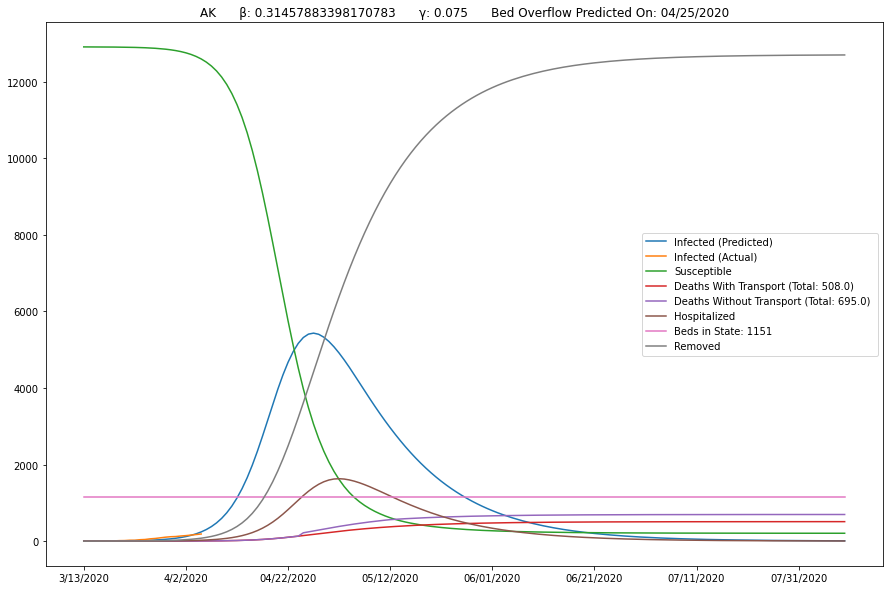

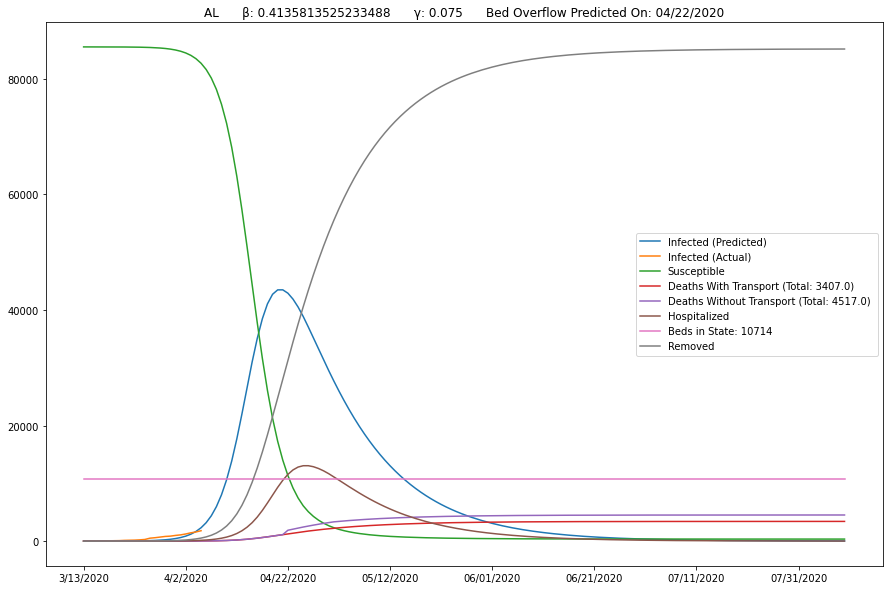

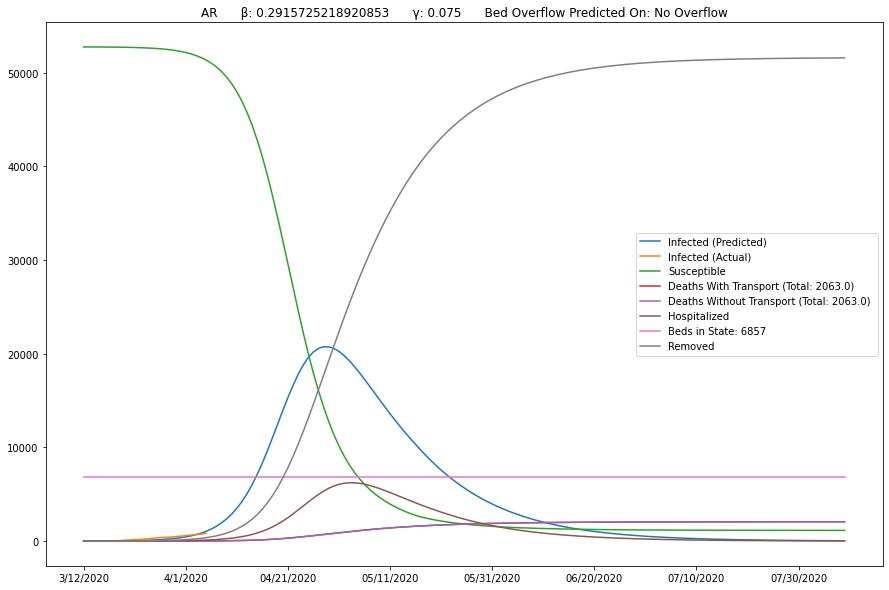

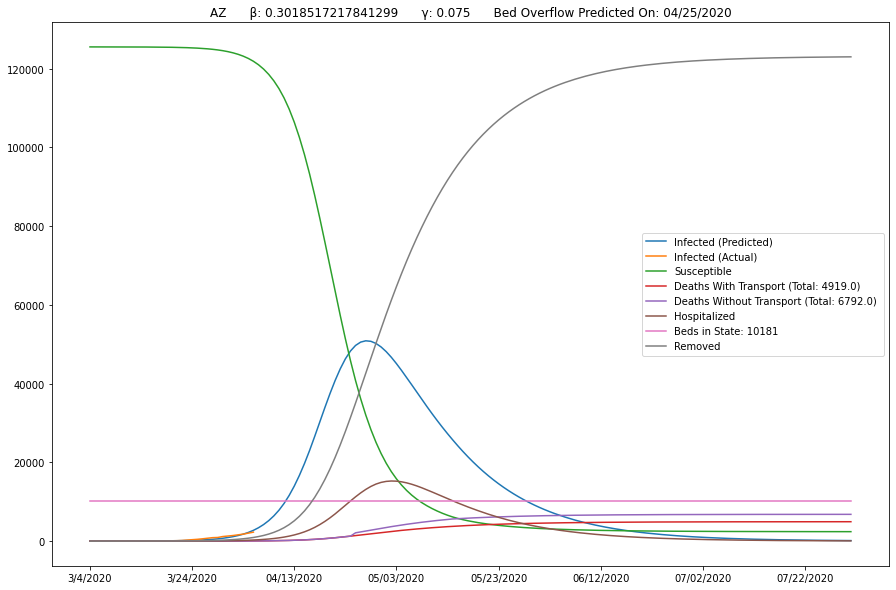

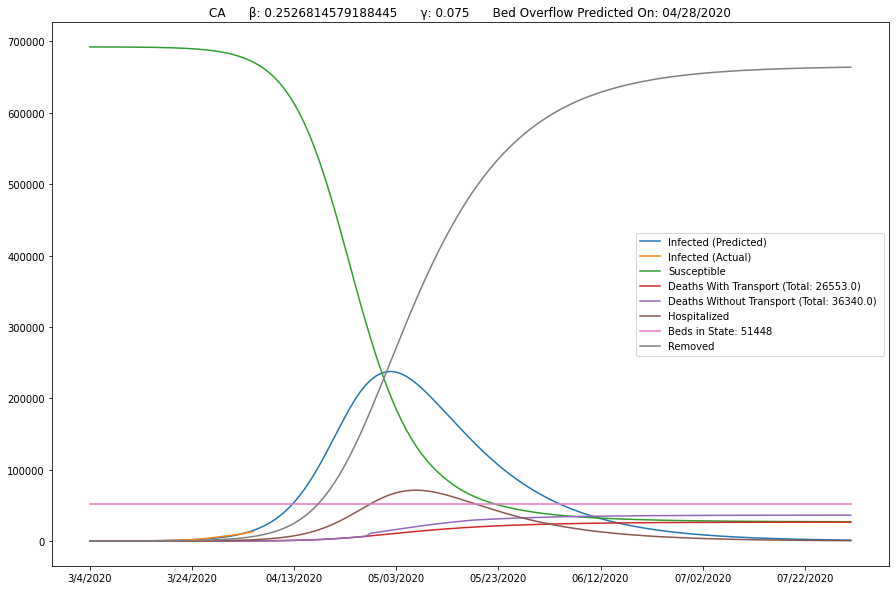

...

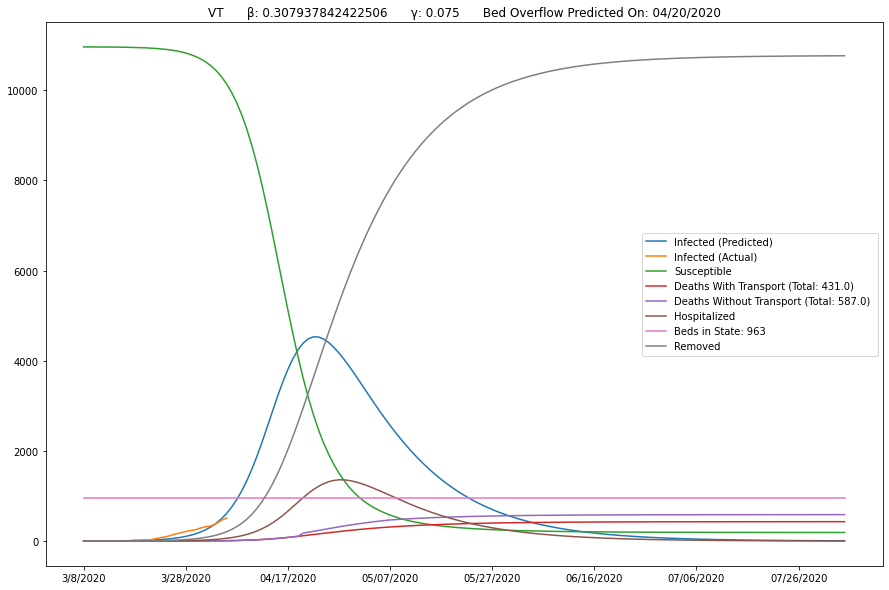

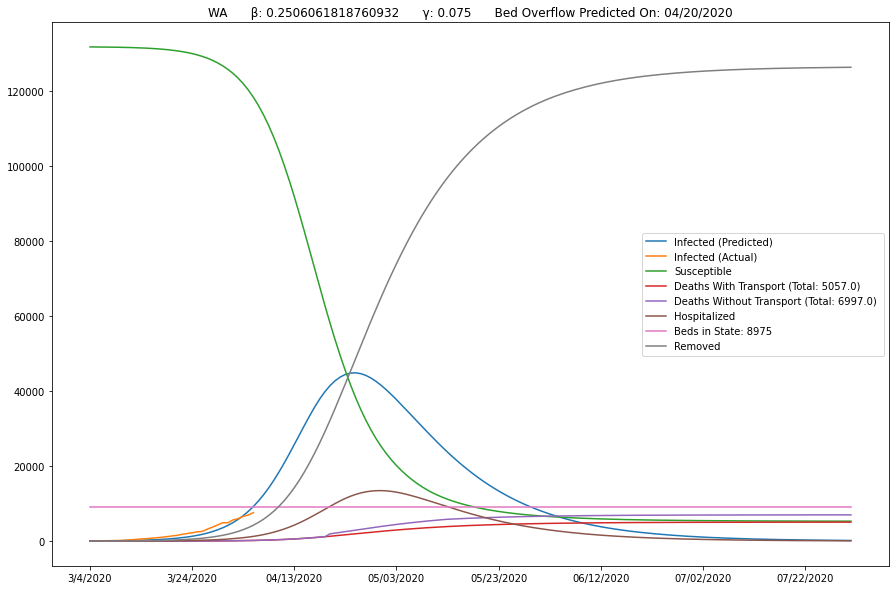

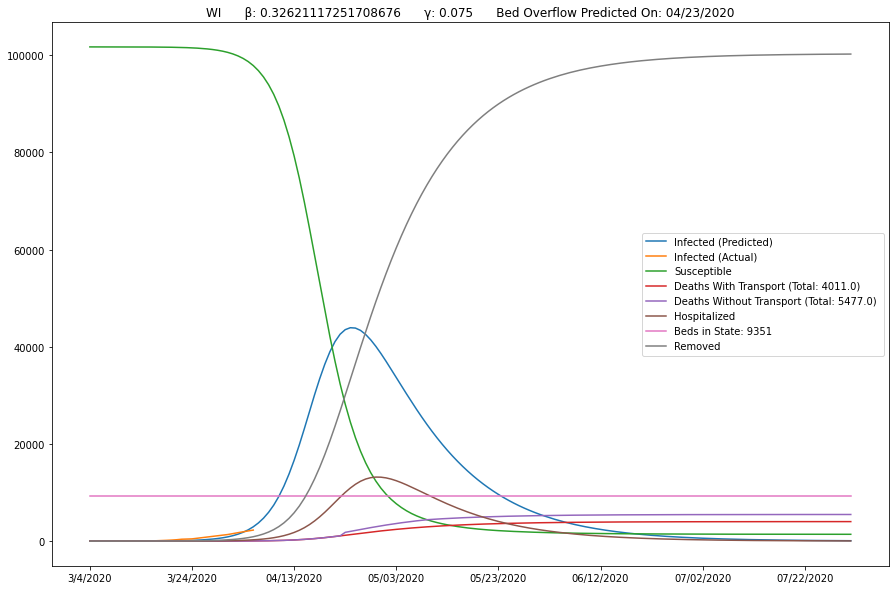

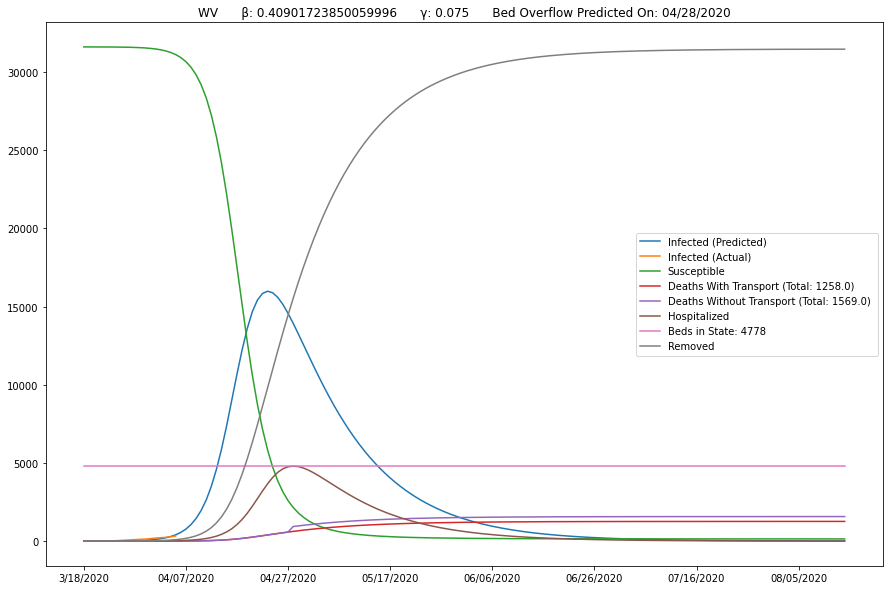

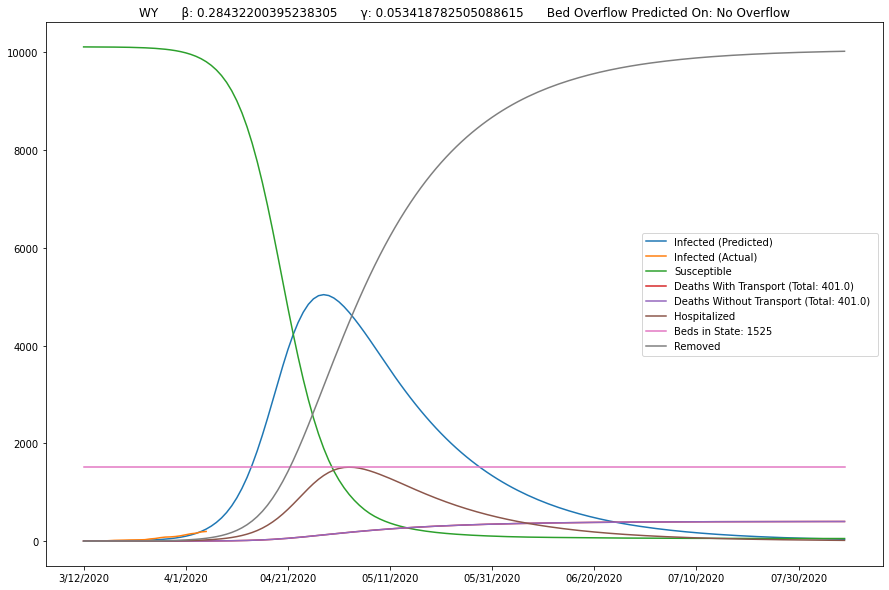

In [37]:
basepath = os.path.abspath('Plots')
all_state_df_list = []

deaths_total_transport = []
deaths_total_no_transport = []

STATE_POP = {
'CA': 39557050,
'TX': 28701850,
'FL': 21299330,
'NY': 19542210,
'PA': 12807060,
'IL': 12741080,
'OH': 11689440,
'GA': 10519480,
'NC': 10383620,
'MI': 9956200,
'NJ': 8908520,
'VA': 8517690,
'WA': 7535590,
'AZ': 7171650,
'MA': 6902150,
'TN': 6770010,
'TN': 6770010,
'IN': 6691880,
'MO': 6126450,
'MD': 6042720,
'WI': 5813570,
'CO': 5695560,
'MN': 5611180,
'SC': 5084130,
'AL': 4887870,
'LA': 4659980,
'KY': 4468400,
'OR': 4190710,
'OK': 3943080,
'CT': 3572670,
'PR': 3195150,
'UT': 3161110,
'IA': 3156150,
'NV': 3033490,
'AR': 3013830,
'MS': 2986530,
'KS': 2911510,
'NM': 2095430,
'NE': 1929270,
'WV': 1805830,
'ID': 1754210,
'HI': 1420490,
'NH': 1356460,
'ME': 1338400,
'MT': 1062310,
'RI': 1057320,
'DE': 967171,
'SD': 882235,
'ND': 760077,
'AK': 737438,
'DC': 702455,
'VT': 626299,
'WY': 577737,
'GU': 164229,
'VI': 107268,   
'AS': 55641,
'MP': 55144
}

class Learner(object):
    def __init__(self, state, loss, s_0, i_0, r_0, date):
        self.state = state
        self.loss = loss
        self.s_0 = s_0
        self.i_0 = i_0
        self.r_0 = r_0
        self.date = date


    def load_confirmed(self, state):

#         Load confirmed cases

        this_state_df = states_df[states_df['state'] == state]
        this_state_df = this_state_df.loc[:,['date','positive']][::-1].reset_index()
        this_state_df = this_state_df[['date','positive']]
        this_state_df = this_state_df[this_state_df.loc[this_state_df['date'] == self.date].index[0]::]
        this_state_df = this_state_df.set_index("date").T
        this_state = this_state_df.to_dict("list")
        this_state_df = pd.DataFrame(this_state) 
        return this_state_df.iloc[0].loc[self.date:]

    def extend_index(self, index, new_size):
        values = index.values
        current = datetime.strptime(index[-1], '%m/%d/%Y')
        while len(values) < new_size:
            current = current + timedelta(days=1)
            values = np.append(values, datetime.strftime(current, '%m/%d/%Y'))
        return values

    def predict(self, beta, gamma, data):

#         Predict how the number of people in each compartment can be changed through time toward the future.
#         The model is formulated with the given beta and gamma.

        predict_range = 150
        new_index = self.extend_index(data.index, predict_range)
        size = len(new_index)
        def SIR(t, y):
            S = y[0]
            I = y[1]
            R = y[2]
            return [-beta*S*I/self.s_0, beta*S*I/self.s_0-gamma*I, gamma*I]
        extended_actual = np.concatenate((data.values, [None] * (size - len(data.values))))
        return new_index, extended_actual, solve_ivp(SIR, [0, size], [self.s_0,self.i_0,self.r_0], t_eval=np.arange(0, size, 1))

    def train(self):
        
#         Run the optimization to estimate beta and gamma fitting the given confirmed cases.

        data = self.load_confirmed(self.state)
        optimal = minimize(
            loss,
            [.15, 0.055],
            args=(data, self.s_0, self.i_0, self.r_0),
            method='L-BFGS-B',
            bounds=[(0, .5), (0.05, 0.075)],
            options={'disp': True}
        )

        beta, gamma = optimal.x
        new_index, extended_actual, prediction = self.predict(beta, gamma, data)
        beds_in_state = int(NYT_Beds_df.loc[NYT_Beds_df['State'] == str(self.state)]['Total Potentially Available Beds'])
        beds_in_state_arr = np.repeat(beds_in_state, len(new_index))
        offset = [0, 0, 0, 0, 0]
        y_hospitalized = np.concatenate((offset, prediction.y[1]*0.3), axis=None)[:-5]
        
        deaths_with_trans = prediction.y[2]*0.04

        try:
            #Find the location where predicted hospitalization exceeds hospital bed capacity
            over_cap_arr = np.greater(y_hospitalized,beds_in_state_arr)
            over_cap_index = np.where(over_cap_arr==True)[0][0]
            last_item = len(np.where(over_cap_arr==True)[0]) - 1
            under_cap_index = np.where(over_cap_arr==True)[0][last_item]
            over_cap_arr_indices = np.where(over_cap_arr==True)[0]
            diff_array = np.arange(under_cap_index+1, len(deaths_with_trans), 1) 
            
            #Assumed increase in mortality due to lack of hospital capacity (50% increase)
            deaths_incr_mult = deaths_with_trans[over_cap_arr_indices]*1.5
            
            diff = deaths_incr_mult[len(deaths_incr_mult)-1] - deaths_with_trans[under_cap_index]
            deaths_incr_add = deaths_with_trans[diff_array] + diff
            end_deaths_without_trans = np.concatenate((deaths_incr_mult, deaths_incr_add), axis=None)
            end_length = len(end_deaths_without_trans)
            start_deaths_without_trans = deaths_with_trans[:-end_length]
            deaths_without_trans = np.concatenate((start_deaths_without_trans, end_deaths_without_trans), axis=None)
        except:
            # If hopsital bed capacity is never exceeded, deaths with transportation = deaths withouth transportation
            deaths_without_trans = deaths_with_trans
#         print(deaths_total_transport)
        deaths_total_transport.append(deaths_with_trans[149])
        deaths_total_no_transport.append(deaths_without_trans[149])
         
#         print(deaths_total_transport)
#         print(deaths_total_no_transport)
        
        df = pd.DataFrame({
            'Infected (Predicted)': prediction.y[1],
            'Infected (Actual)': extended_actual,
            'Susceptible': prediction.y[0],
            'Deaths With Transport (Total: '+str(np.round(deaths_with_trans[149]))+') ': deaths_with_trans, #China Death Rate (Betweeb South Korea and Italy)
            'Deaths Without Transport (Total: '+str(np.round(deaths_without_trans[149]))+') ': deaths_without_trans, #Assuming 50% incr in death without hospital
            'Hospitalized': y_hospitalized,
            'Beds in State: '+str(beds_in_state): beds_in_state_arr,
            'Removed': prediction.y[2]
        }, index=new_index)
        stateName = np.full((1, 150), state)

        currentStateDF = pd.DataFrame({"state": stateName[0], 
                                       "infected": prediction.y[1],
                                       "hospitalized": y_hospitalized,
                                       "beds": beds_in_state_arr,
                                       "date": new_index,
                                       "ratio":(np.divide(y_hospitalized,beds_in_state_arr))}) 
        print(currentStateDF)
        all_state_df_list.append(currentStateDF)

        overflowOn = ''
        try: 
            overflowOn = new_index[over_cap_index]
        except:
            overflowOn = 'No Overflow'
        

        fig, ax = plt.subplots(figsize=(15, 10))
        ax.set_title(str(self.state)+'      β: '+str(beta)+'      γ: '+str(gamma)+'      Bed Overflow Predicted On: '+overflowOn)
        df.plot(ax=ax)

        fig.savefig(f"Plots/{self.state}.png")
        
def loss(point, data, s_0, i_0, r_0):

#     RMSE between actual confirmed cases and the estimated infectious people with given beta and gamma.

    size = len(data)
    beta, gamma = point
    def SIR(t, y):
        S = y[0]
        I = y[1]
        R = y[2]
        return [-beta*S*I/s_0, beta*S*I/s_0-gamma*I, gamma*I]
    solution = solve_ivp(SIR, [0, size], [s_0,i_0,r_0], t_eval=np.arange(0, size, 1), vectorized=True)
    return np.sqrt(np.mean((solution.y[1] - data)**2))


dateList = []
for state in states_df.state.unique():

#state = 'NY'
# print(state)

    date_state_df = states_df[states_df['state'] == state]

    print(state)
    if state != 'GU' and state != 'MP' and state != 'VI' and state != 'AS':
        start_index = date_state_df['positive'][date_state_df['positive'] != 0].index[-1]
        start_pos = date_state_df['positive'][start_index]
        start_date = date_state_df['date'][start_index]
        dateList.append(start_date)
        learner = Learner(state, loss, s_0 = 0.0175*STATE_POP[state], i_0 = start_pos, r_0 = 0, date = start_date)
        #0.0175
        learner.train()

all_state_df = pd.concat(all_state_df_list)

print(sum(deaths_total_transport))
print(sum(deaths_total_no_transport))
# print(all_state_df)
# learner = Learner('NY', loss, s_0 = 20000000, i_0 = 6, r_0 = 0, date = '3/6/2020')

# learner.train()

In [22]:
import plotly.express as px

#Create Transportation Visual

data = all_state_df
#print(data['state'].unique())

fig = px.choropleth(data, locations='state', color='ratio', animation_frame='date', animation_group='ratio', color_continuous_scale='RdYlBu_r', range_color=(0, 2), locationmode="USA-states", scope="usa")
fig.show()

['AK' 'AL' 'AR' 'AZ' 'CA' 'CO' 'CT' 'DC' 'DE' 'FL' 'GA' 'HI' 'IA' 'ID'
 'IL' 'IN' 'KS' 'KY' 'LA' 'MA' 'MD' 'ME' 'MI' 'MN' 'MO' 'MS' 'MT' 'NC'
 'ND' 'NE' 'NH' 'NJ' 'NM' 'NV' 'NY' 'OH' 'OK' 'OR' 'PA' 'PR' 'RI' 'SC'
 'SD' 'TN' 'TX' 'UT' 'VA' 'VT' 'WA' 'WI' 'WV' 'WY']


In [23]:
#Build dataframe that assumes best case transportation scenario - Every state has immediate daily access to entire supply of US hospital bes. 

US_df = all_state_df[['infected', 'hospitalized', 'beds', 'date']].sort_values(by='date')

US_df['date'] = pd.to_datetime(US_df['date'])


US_df = US_df.groupby(US_df['date'].dt.date).sum()
US_df.loc[:,'beds'] = US_df['beds'].max(axis = 0) #set beds to max beds of all time (different dates per states)
US_df['ratio'] = US_df['hospitalized']/US_df['beds']

US_df = US_df.reset_index()
US_df['date'] = US_df['date'].astype(str)

US_by_state_list = []

for state in states_df.state.unique():
    
    currentStateDF = pd.DataFrame({"infected": US_df["infected"],
                                    "hospitalized": US_df["hospitalized"],
                                    "beds": US_df["beds"],
                                    "date": US_df["date"],
                                    "ratio":US_df["ratio"]}) 
    
    currentStateDF.loc[:,'state'] = state
    US_by_state_list.append(currentStateDF)

US_by_state_df = pd.concat(US_by_state_list)
US_by_state_df.reset_index(inplace = True)

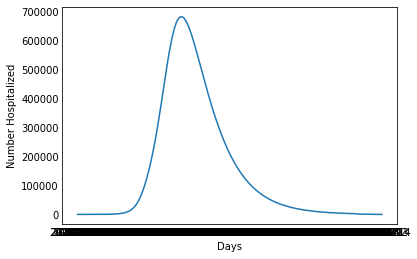

In [24]:
#Sanity check plot. This is no different than looking at US average infection rate "lock step"?
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111, axisbelow=True)
ax.plot(US_df['date'], US_df['hospitalized'])
ax.set_xlabel('Days')
ax.set_ylabel('Number Hospitalized')
ax.yaxis.set_tick_params(length=0)
ax.xaxis.set_tick_params(length=0)
ax.grid(b=True, which='major', c='w', lw=2, ls='-')
plt.show()

In [25]:
#Create Transportation Visual

data = US_by_state_df

fig = px.choropleth(data, locations='state', color='ratio', animation_frame='date', animation_group='ratio', color_continuous_scale='RdYlBu_r', range_color=(0, 2), locationmode="USA-states", scope="usa")
fig.show()